<a href="https://colab.research.google.com/github/kavya-sree-chandhi/Image-Classification-for-Disease-Detection---Brain-Tumor/blob/main/Image_Classification_for_Disease_Detection_Brain_Tumor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title TITLE

from IPython.display import HTML, display

def title(title, font_size=24, color='navy', font_family='Arial, sans-serif', shadow='2px 2px 4px grey'):

    display(HTML(f"<h1 style='color: {color}; font-size: {font_size}px; text-align: center; font-family: {font_family}; text-shadow: {shadow};'>{title}</h1>"))

# Usage
title("Image Classification for Disease Detection - Brain Tumor")

---

### **Project Title:** Image Classification for Disease Detection

---

#### **Motivation**

**Objective:**

Develop a machine learning system to accurately and efficiently detect and classify diseases in medical images, such as X-rays and Brain Magnetic Resonance Imaging (MRI) scans.

**Key Points:**

1. **Enhance Medical Diagnostics:**
   - Leverage machine learning to improve the precision and speed of medical image analysis.
   - Contribute to better patient care and healthcare outcomes.

2. **Data Collection and Preprocessing:**
   - Assemble a comprehensive dataset of labeled medical images.
   - Perform data preprocessing, including resizing, normalization, and augmentation.

3. **Deep Learning Techniques:**
   - Utilize Convolutional Neural Networks (CNNs) for image classification.
   - Implement transfer learning with pre-trained models like VGG, ResNet, or Inception.

4. **Impact:**
   - Revolutionize disease detection and diagnosis with advanced ML capabilities.
   - Support healthcare professionals in delivering more accurate and timely diagnoses.

#**GOAL**

**To conduct a comparative study of various deep learning frameworks and architectures, focusing on TensorFlow, Keras, and PyTorch, in the context of disease detection using medical images. The study will assess the performance, efficiency, and results of different models and training approaches, including Convolutional Neural Networks (CNNs), VGG, and ResNet.**

### Table of contents

1. **Introduction**
   - Overview of the Project
   - Objectives and Goals

2. **Environment Setup**
   - Google Colab Configuration
   - Mounting Google Drive

3. **Library Importation**
   - Inbuilt Libraries
   - External Libraries

4. **Data Acquisition**
   - Kaggle Dataset Download
   - Unzipping Dataset

5. **Data Preprocessing and Exploration**
   - Importing Image Filenames
   - Creating DataFrames for Images
   - Exploratory Data Analysis (EDA)
     - Image Loading and Visualization
     - Image Property Analysis
     - Label Distribution Analysis

6. **Feature Extraction**
   - Texture Features (Local Binary Patterns)
   - Color Histograms
   
7. **Data Augmentation and Preprocessing**
   - Image Data Augmentation
   - Data Splitting into Training and Test Sets
   - Data Conversion to Tensor Format

8. **Model Implementation**
   - VGG16 Model Implementation
     - Model Architecture
     - Training Process
     - Model Evaluation and History Saving
   - CNN Model Implementation
     - Model Architecture
     - Training Process
     - Model Evaluation
   - ResNet50 Model Implementation
     - Model Architecture
     - Training Process
     - Model Evaluation

9. **Model Predictions and Visualization**
   - Predictions Using VGG16, CNN, and ResNet50
   - Visualization of Predictions

10. **Performance Evaluation**
    - Training Time Analysis
    - Loss and Accuracy Graphs
    - Confusion Matrix and Classification Report
    - Precision, Recall, and F1-Score Analysis
    - Comparative Analysis of Models

![Image Description](https://www.cityofhope.org/sites/www/files/2023-03/Nucleus-Si2033-small.jpg)


### Project Motivation

#### 1. Disease Detection from MRI Image Observation

Magnetic Resonance Imaging (MRI) is a crucial tool for the detection and diagnosis of brain tumors. Here's how it helps:

- **High-Resolution Imaging**: MRI provides high-resolution images of the brain, enabling detailed observation of the brain's structure.
- **Contrast Dye**: Often, a contrast dye is used during the MRI scan to make the tumor more visible. This helps in distinguishing tumor tissue from normal brain tissue.
- **Types of Tumors**: MRI can help identify various types of brain tumors, whether benign (noncancerous) or malignant (cancerous).
- **Tumor Location and Size**: It provides precise information about the location, size, and extent of the tumor.
- **Treatment Planning**: The detailed images from an MRI scan are crucial for planning surgeries, radiation therapy, or other treatments.

#### 2. Disease Symptoms

Symptoms of a brain tumor can vary depending on the tumor's size, type, and location. Common symptoms include:

- **Headaches**: Often worse in the morning or when performing certain activities.
- **Seizures**: Changes in electrical activity in the brain can cause seizures.
- **Nausea or Vomiting**: Especially in the morning.
- **Cognitive Changes**: Difficulty in thinking, memory problems, or changes in personality.
- **Sensory Changes**: Altered vision, hearing, smell, or touch.
- **Motor Changes**: Difficulty with balance, strength, or coordination.
- **Speech Difficulties**: Problems with understanding or producing speech.

#### 3. Uses of Quickly Detecting the Tumor with the MRI Image Obtained

Quick detection of a brain tumor using MRI imaging has several significant benefits:

- **Early Treatment**: Early detection allows for timely treatment, which can be crucial in managing the tumor effectively.
- **Better Prognosis**: Early diagnosis generally leads to a better prognosis, as many treatment options work best when the tumor is small and hasn't spread.
- **Reduced Complications**: By detecting tumors early, the risk of complications or severe damage to brain function can be minimized.
- **Tailored Treatment Plans**: Quick detection allows healthcare providers to develop a more effective and personalized treatment plan.
- **Monitoring Treatment Efficacy**: MRI can be used regularly to monitor the tumor's response to treatment and make necessary adjustments.

### Environment Setup & Library Importation

In [ ]:
# @title Import libraries
#Inbuilt Liraries
import os
import glob
import shutil
import random
 # Garbage Collection
import gc
import json

#External Liraries
import pandas as pd
import numpy as np
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
from skimage import feature
from skimage import exposure
from skimage import io
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from keras.models import load_model

#VGG16 Model
from keras.applications.vgg16 import VGG16
from keras.layers import Input
from keras.optimizers import Adam
import tensorflow as tf

#CNN Model
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator

### Data Acquisition

In [ ]:
!pip install kaggle

from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))


Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 72 bytes


In [ ]:
# Making sure we have the .kaggle directory
!mkdir -p ~/.kaggle

# Copy the kaggle.json to this directory
!cp kaggle.json ~/.kaggle/

# Change the permission of the file
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d ahmedhamada0/brain-tumor-detection

 77% 65.0M/84.0M [00:00<00:00, 128MB/s] 
100% 84.0M/84.0M [00:00<00:00, 136MB/s]


In [ ]:
!unzip -q /content/brain-tumor-detection.zip

replace Br35H-Mask-RCNN/TEST/annotations_test.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

### Data Preprocessing and Exploration

In [ ]:

def import_image_filenames(path: str) -> list:
    """
    Imports image filenames from a specified directory.

    Args:
    path (str): The file path pattern to search for images.

    Returns:
    list: A list of image file paths.
    """
    return [filename for filename in glob.glob(path)]

def create_dataset(path: str, label: str = None) -> pd.DataFrame:
    """
    Creates a DataFrame for images with an optional label.

    Args:
    path (str): The file path pattern to search for images.
    label (str, optional): The label for the images. Defaults to None.

    Returns:
    pd.DataFrame: A DataFrame containing image paths and labels.
    """
    image_filenames = import_image_filenames(path)
    if label:
        return pd.DataFrame({'image': image_filenames, 'label': label})
    else:
        return pd.DataFrame({'image': image_filenames})

base_dir = '/content'

# Paths using os.path.join
path_healthy = os.path.join(base_dir, 'no', '*.jpg')
path_affected = os.path.join(base_dir, 'yes', '*.jpg')
path_prediction = os.path.join(base_dir, 'pred', '*.jpg')

# Create DataFrames
df_healthy = create_dataset(path_healthy, 'Healthy')
df_affected = create_dataset(path_affected, 'Infected')
df_prediction = create_dataset(path_prediction)

# Concatenate training data
training_data = pd.concat([df_healthy, df_affected])
training_data.head()

,image,label
0,/content/no/no466.jpg,Healthy
1,/content/no/no748.jpg,Healthy
2,/content/no/no170.jpg,Healthy
3,/content/no/no289.jpg,Healthy
4,/content/no/no1392.jpg,Healthy


### EDA - Exploratory Data Analysis

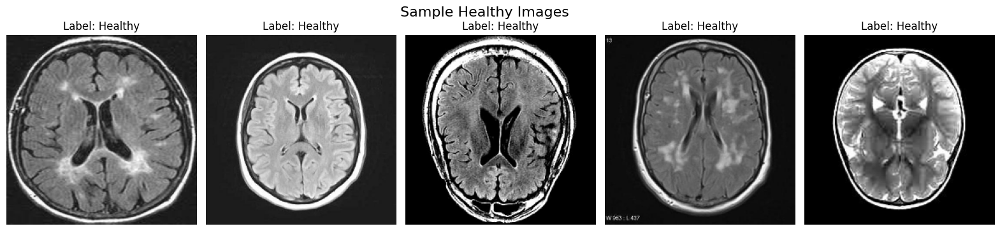

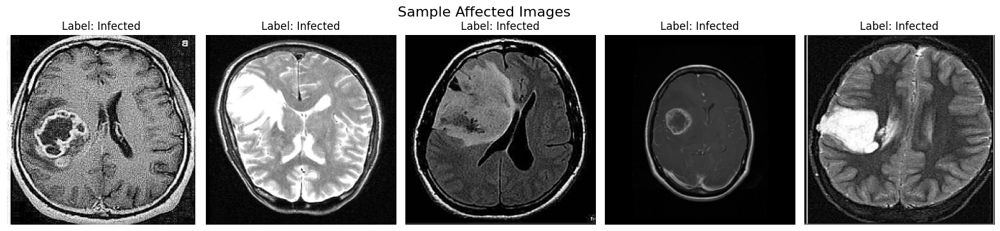

In [ ]:
# Function to load an image
def load_image(path, target_size=(224, 224)):
    """
    Loads and resizes an image to a target size.

    Args:
    path (str): The file path of the image.
    target_size (tuple): The target size to resize to (width, height).

    Returns:
    np.array: The loaded and resized image.
    """
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, target_size)
    return img_resized

# Function to plot images
def plot_images(df, title):
    num_images = 5
    sample_df = df.sample(num_images)
    fig, axes = plt.subplots(1, num_images, figsize=(20, 4))

    for ax, (_, row) in zip(axes, sample_df.iterrows()):
        img = load_image(row['image'])
        ax.imshow(img)
        ax.set_title(f"Label: {row['label']}")
        ax.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.subplots_adjust(wspace=0.05, hspace=0)
    plt.show()

# Visualize some images
plot_images(df_healthy, 'Sample Healthy Images')
plot_images(df_affected, 'Sample Affected Images')


In [ ]:
#grayscale shape: 224, 224, 1 [0, 255] [1]

#RGB Shape: 224, 224, 3 [1, 1, 1]

In [ ]:
# Function to extract image properties
def get_image_properties(image_path):
    img = load_image(image_path)
    height, width, _ = img.shape
    return height, width, width / height

def analyze_image_properties(df):
    properties = df['image'].apply(lambda img_path: get_image_properties(img_path))
    properties_df = pd.DataFrame(properties.tolist(), columns=['height', 'width', 'aspect_ratio'])
    return properties_df

properties_healthy = analyze_image_properties(df_healthy)
properties_affected = analyze_image_properties(df_affected)

print("Healthy Images Properties:")
print(properties_healthy.describe())

print("\Infected Images Properties:")
print(properties_affected.describe())


Healthy Images Properties:
       height   width  aspect_ratio
count  1500.0  1500.0        1500.0
mean    224.0   224.0           1.0
std       0.0     0.0           0.0
min     224.0   224.0           1.0
25%     224.0   224.0           1.0
50%     224.0   224.0           1.0
75%     224.0   224.0           1.0
max     224.0   224.0           1.0
\Infected Images Properties:
       height   width  aspect_ratio
count  1500.0  1500.0        1500.0
mean    224.0   224.0           1.0
std       0.0     0.0           0.0
min     224.0   224.0           1.0
25%     224.0   224.0           1.0
50%     224.0   224.0           1.0
75%     224.0   224.0           1.0
max     224.0   224.0           1.0


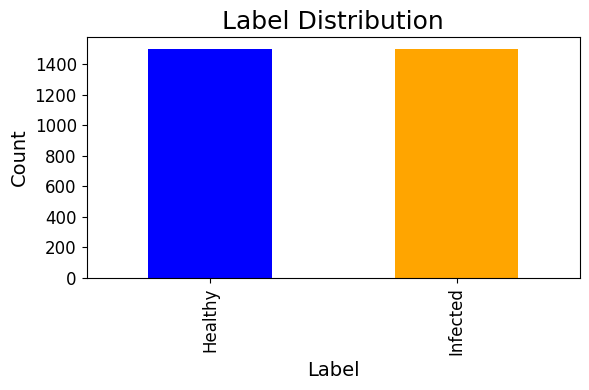

In [ ]:
label_counts = training_data['label'].value_counts()

plt.rcParams['figure.figsize'] = [6, 4]
plt.rcParams['figure.autolayout'] = True

ax = label_counts.plot(kind='bar', color=['blue', 'orange'])

ax.set_title('Label Distribution', fontsize=18)
ax.set_xlabel('Label', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()


### Feature Extraction

In [ ]:

# Function to extract Local Binary Pattern texture features
def extract_lbp_features(image_path):
    img = load_image(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    lbp = feature.local_binary_pattern(gray, P=24, R=3, method='uniform')
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, 24 + 3), range=(0, 24 + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    return hist

# Function to extract color histograms
def extract_color_histogram(image_path):
    img = load_image(image_path)
    hist = [cv2.calcHist([img], [i], None, [256], [0, 256]) for i in range(3)]
    hist = np.concatenate(hist).ravel()
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    return hist

# Function to detect edges using Canny edge detector
def extract_edges(image_path):
    img = load_image(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    return edges

# Apply functions to DataFrame and create new columns
def analyze_image_features(df):
    lbp_features = df['image'].apply(lambda img_path: extract_lbp_features(img_path))
    color_histograms = df['image'].apply(lambda img_path: extract_color_histogram(img_path))
    edges = df['image'].apply(lambda img_path: extract_edges(img_path))

    features_df = pd.DataFrame({
        'lbp_features': lbp_features.tolist(),
        'color_histograms': color_histograms.tolist(),
        'edges': edges.tolist()
    })
    return features_df

features_healthy = analyze_image_features(df_healthy)
features_affected = analyze_image_features(df_affected)



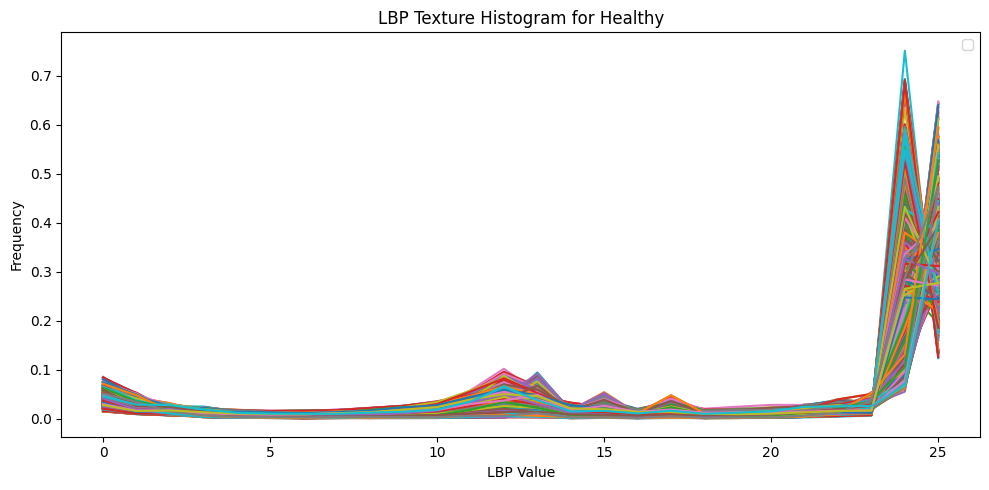

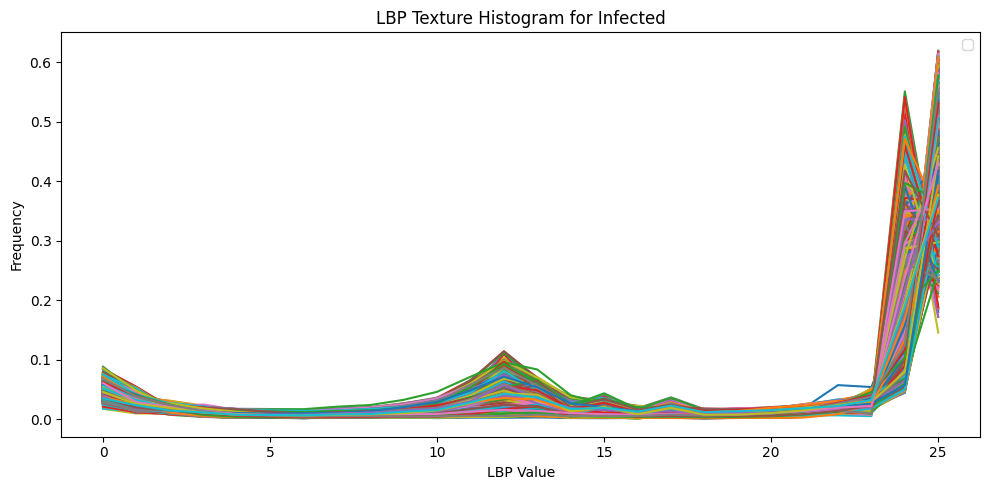

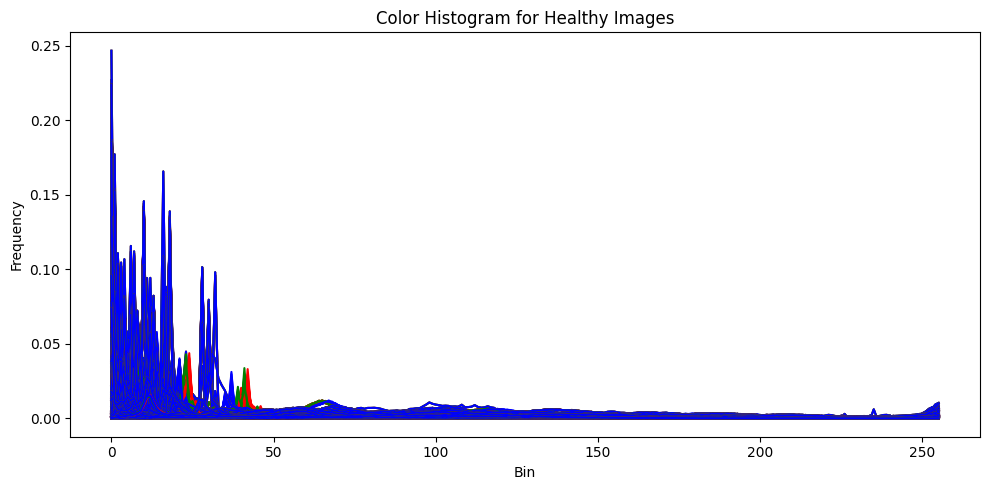

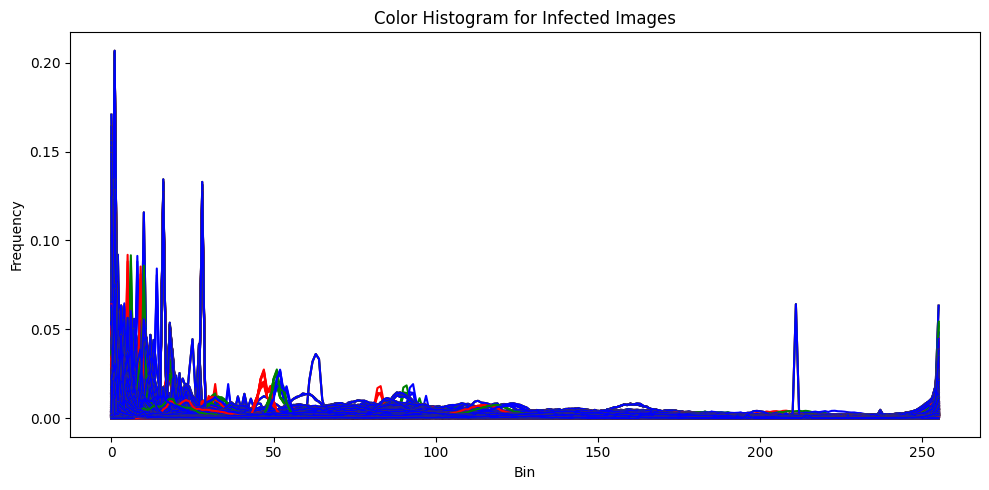

In [ ]:

# Function to plot histogram of Local Binary Patterns
def plot_lbp_histograms(features_df, title):
    plt.figure(figsize=(10, 5))
    for i, row in features_df.iterrows():
        plt.plot(row['lbp_features'])
    plt.title(f"LBP Texture Histogram for {title}")
    plt.xlabel('LBP Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

# Function to plot color histograms
def plot_color_histograms(features_df, title):
    color = ('r', 'g', 'b')
    plt.figure(figsize=(10, 5))
    for i, row in features_df.iterrows():
        for j, col in enumerate(color):
            plt.plot(row['color_histograms'][j*256:(j+1)*256], color=col)
    plt.title(f"Color Histogram for {title} Images")
    plt.xlabel('Bin')
    plt.ylabel('Frequency')
    plt.show()


# Visualize LBP histograms for healthy images
plot_lbp_histograms(features_healthy, 'Healthy')

# Visualize LBP histograms for Infected images
plot_lbp_histograms(features_affected, 'Infected')

# Visualize color histograms for healthy images
plot_color_histograms(features_healthy, 'Healthy')

# Visualize color histograms for Infected images
plot_color_histograms(features_affected, 'Infected')

In [ ]:
gc.collect()

327102

### Data Augmentation and Preprocessing

In [ ]:
# @title Storing Training Augmented_image Data from the image Path Data

data_gen = ImageDataGenerator(
    rescale=1./255
)

# Function to load image and apply transformations
def load_and_augment_image(file_path):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    img = img.reshape((1,) + img.shape)
    return next(data_gen.flow(img))[0]

# Apply the function to each image in the DataFrame
training_data['augmented_image'] = training_data['image'].apply(load_and_augment_image)
training_data['label'] = training_data['label'].replace({'Healthy': 0, 'Infected': 1})

In [ ]:
# @title Creating X_train & X_test
# Split the data into training and validation sets (80% train, 20% validation)
X_train, X_test, y_train, y_test = train_test_split(training_data['augmented_image'], training_data['label'], test_size=0.2, shuffle=True, random_state=42)

In [ ]:
# @title Convert X_train & Test Numpy to Tensor
X_train_array = np.stack(X_train.to_numpy())
X_train_array = X_train_array.astype(np.float32)
X_train = tf.convert_to_tensor(X_train_array)
print("X_train Tensor Shape:", X_train.shape)
X_test_array = np.stack(X_test.to_numpy())
X_test_array = X_test_array.astype(np.float32)
X_test = tf.convert_to_tensor(X_test_array)
# Check the shape
print("X_test Tensor Shape:", X_test.shape)

X_train Tensor Shape: (2400, 224, 224, 3)
X_test Tensor Shape: (600, 224, 224, 3)


In [ ]:
gc.collect()

27887

### VGG16 Model Implementation

In [ ]:
# @title Summary of the Model
input_tensor = Input(shape=(224, 224, 3))
vgg16_base = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze layers
for layer in vgg16_base.layers:
    layer.trainable = False

model = Sequential()
model.add(vgg16_base)
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

58889256/58889256 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 17926209 (68.38 MB)
Trainable params: 3211521 (12.25 MB)
Non-trainable params: 14714688 (56.13 MB)
__________

In [ ]:
# @title Training The Model

input_tensor = Input(shape=(224, 224, 3))
vgg16_base = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze layers
for layer in vgg16_base.layers:
    layer.trainable = False

model = Sequential()
model.add(vgg16_base)
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Use Adam optimizer
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Optimized callbacks
early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True, verbose=1)
vgg_checkpoint = ModelCheckpoint("VGG_best_model.h5", save_best_only=True, save_freq='epoch')
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, mode='min', verbose=1)


history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    epochs=5,
                    batch_size=64,
                    callbacks=[early_stop, vgg_checkpoint, lr_reduction])

Epoch 1/5
38/38 [==============================] - 1589s 42s/step - loss: 0.5109 - accuracy: 0.7375 - val_loss: 0.3579 - val_accuracy: 0.8267 - lr: 1.0000e-04
Epoch 2/5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 1551s 41s/step - loss: 0.3152 - accuracy: 0.8600 - val_loss: 0.2343 - val_accuracy: 0.9233 - lr: 1.0000e-04
Epoch 3/5
38/38 [==============================] - 1531s 40s/step - loss: 0.2151 - accuracy: 0.9300 - val_loss: 0.1802 - val_accuracy: 0.9500 - lr: 1.0000e-04
Epoch 4/5
38/38 [==============================] - 1528s 40s/step - loss: 0.1661 - accuracy: 0.9533 - val_loss: 0.1487 - val_accuracy: 0.9633 - lr: 1.0000e-04
Epoch 5/5
38/38 [==============================] - 1526s 40s/step - loss: 0.1385 - accuracy: 0.9617 - val_loss: 0.1231 - val_accuracy: 0.9717 - lr: 1.0000e-04


In [ ]:
# @title Saving Model History

history_data = history.history

# Convert numpy.float32 values to Python floats
for key in history_data:
    history_data[key] = [float(val) for val in history_data[key]]

# Save the history data to a JSON file
with open('vggnet_model_history.json', 'w') as f:
    json.dump(history_data, f)

In [ ]:
# Load the history data from the JSON file
with open('/content/drive/MyDrive/vggnet_model_history.json', 'r') as f:
    loaded_VGG161_history = json.load(f)

In [ ]:
gc.collect()

8

In [ ]:
# @title Second Execution after 5 - Epochs

history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    epochs=5,
                    batch_size=64,
                    callbacks=[early_stop, vgg_checkpoint, lr_reduction])

Epoch 1/5
38/38 [==============================] - ETA: 0s - loss: 0.1151 - accuracy: 0.9729 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 1592s 42s/step - loss: 0.1151 - accuracy: 0.9729 - val_loss: 0.1049 - val_accuracy: 0.9767 - lr: 1.0000e-04
Epoch 2/5
38/38 [==============================] - 1589s 42s/step - loss: 0.1014 - accuracy: 0.9750 - val_loss: 0.0916 - val_accuracy: 0.9783 - lr: 1.0000e-04
Epoch 3/5
38/38 [==============================] - 1594s 42s/step - loss: 0.0872 - accuracy: 0.9796 - val_loss: 0.0852 - val_accuracy: 0.9833 - lr: 1.0000e-04
Epoch 4/5
38/38 [==============================] - 1822s 48s/step - loss: 0.0696 - accuracy: 0.9883 - val_loss: 0.0774 - val_accuracy: 0.9833 - lr: 1.0000e-04
Epoch 5/5
38/38 [==============================] - 1531s 41s/step - loss: 0.0594 - accuracy: 0.9908 - val_loss: 0.0672 - val_accuracy: 0.9850 - lr: 1.0000e-04


In [ ]:
# @title Saving Model History
import json

history_data = history.history

# Convert numpy.float32 values to Python floats
for key in history_data:
    history_data[key] = [float(val) for val in history_data[key]]

# Save the history data to a JSON file
with open('vggnet_model_history2.json', 'w') as f:
    json.dump(history_data, f)


In [ ]:
# Load the history data from the JSON file
with open('/content/drive/MyDrive/vggnet_model_history2.json', 'r') as f:
    loaded_VGG162_history = json.load(f)

In [ ]:
# @title Saving & Loading VGG16 Trained Model
model.save("vgg16_final_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# @title Load VGG16 Model
vgg_model = load_model("/content/drive/MyDrive/vgg16_final_model.h5")
vgg_model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
vgg_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dense_5 (Dense)             (None, 128)               3211392   
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 1)                 129       
                                                                 
Total params: 17926209 (68.38 MB)
Trainable params: 3211521 (12.25 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


1/1 [==============================] - 6s 6s/step
Prediction Key: 0 = 'Healthy', 1 = 'Infected'
[1 0 1 0 1 0 0 1 0 1]
['Infected', 'Healthy', 'Infected', 'Healthy', 'Infected', 'Healthy', 'Healthy', 'Infected', 'Healthy', 'Infected']


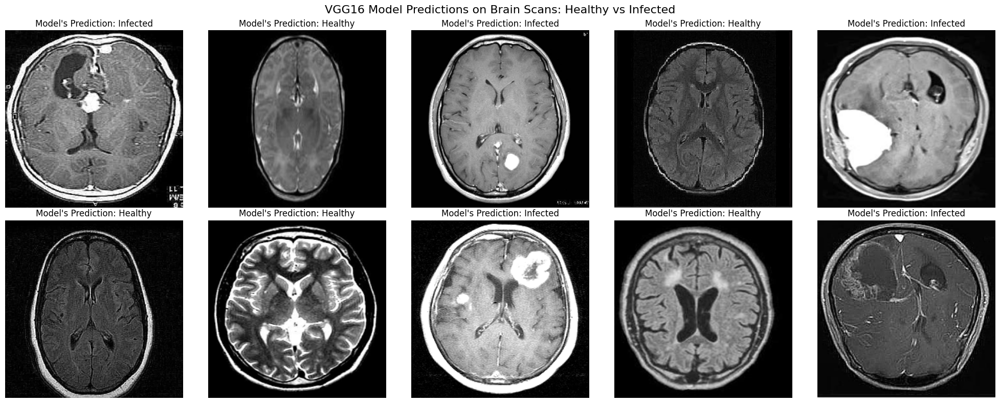

In [ ]:
# @title Prediction Using VGG16 Model

vgg_model = load_model("/content/drive/MyDrive/vgg16_final_model.h5")
vgg_model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

X_pred_test_vgg = X_test[0:10]

# Predict using the VGG16 model
predictions_vgg = vgg_model.predict(X_pred_test_vgg)

#threshold value 0.5
predictions_vgg = (predictions_vgg > 0.5).astype(int).flatten()

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions_vgg)

# Map numerical predictions to corresponding labels
pred_labels_vgg = ['Healthy' if i == 0 else 'Infected' for i in predictions_vgg]
print(pred_labels_vgg)

def pre_visualization(data, predictions, cols=5):
    """
    Visualizes the predictions alongside the images in a grid layout.

    Parameters:
    data (list): List of image data.
    predictions (list): List of predictions corresponding to the data.
    cols (int): Number of columns in the grid display.
    """
    rows = len(data) // cols + (1 if len(data) % cols else 0)

    plt.figure(figsize=(cols * 4, rows * 4))

    for i, (image, pred) in enumerate(zip(data, predictions), 1):
        plt.subplot(rows, cols, i)
        if isinstance(image, np.ndarray):
            img_display = image
        else:
            img_display = image.numpy()

        plt.imshow(img_display.reshape(224, 224, 3))
        plt.title(f"Model's Prediction: {pred}")
        plt.axis('off')
    plt.suptitle("VGG16 Model Predictions on Brain Scans: Healthy vs Infected", fontsize=16)
    plt.tight_layout()
    plt.show()

pre_visualization(X_pred_test_vgg, pred_labels_vgg)



### CNN Model Implementation

In [ ]:
# @title Initialising CNN-MODEL - Summary

# Define the CNN model architecture
def build_model():
    model = Sequential()
    model.add(Conv2D(64, (5, 5), activation='relu', padding='same', strides=(2, 2), input_shape=[224, 224, 3]))
    model.add(MaxPooling2D(2))
    model.add(Conv2D(128, (5, 5), activation='relu', padding='same', strides=(2, 2)))
    model.add(Conv2D(128, (5, 5), activation='relu', padding='same', strides=(2, 2)))
    model.add(Conv2D(256, (5, 5), activation='relu', padding='same', strides=(2, 2)))
    model.add(MaxPooling2D(2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(2, activation='softmax'))
    return model

# Instantiate the model
keras_model = build_model()
keras_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 112, 112, 64)      4864      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 28, 28, 128)       204928    
                                                                 
 conv2d_10 (Conv2D)          (None, 14, 14, 128)       409728    
                                                                 
 conv2d_11 (Conv2D)          (None, 7, 7, 256)         819456    
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 3, 3, 256)         0         
 g2D)                                                 

In [ ]:
# @title Training the CNN Model
cnn_model = build_model()

cnn_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=2,
                           restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint("CNN_model_best.h5", save_best_only=True)
reduce_lr_on_plateau = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                         patience=3, min_lr=1e-5, mode='min', verbose=1)

training_history = cnn_model.fit(X_train, y_train,
                                 validation_data=(X_test, y_test),
                                 epochs=50,
                                 batch_size=10,
                                 callbacks=[early_stop, model_checkpoint, reduce_lr_on_plateau])


Epoch 1/50
240/240 [==============================] - 151s 623ms/step - loss: 0.6419 - accuracy: 0.6196 - val_loss: 0.5488 - val_accuracy: 0.7400 - lr: 1.0000e-04
Epoch 2/50


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


240/240 [==============================] - 150s 624ms/step - loss: 0.5285 - accuracy: 0.7613 - val_loss: 0.4305 - val_accuracy: 0.8350 - lr: 1.0000e-04
Epoch 3/50
240/240 [==============================] - 147s 613ms/step - loss: 0.4266 - accuracy: 0.8050 - val_loss: 0.3164 - val_accuracy: 0.8617 - lr: 1.0000e-04
Epoch 4/50
240/240 [==============================] - 149s 622ms/step - loss: 0.3298 - accuracy: 0.8696 - val_loss: 0.2211 - val_accuracy: 0.9183 - lr: 1.0000e-04
Epoch 5/50
240/240 [==============================] - 159s 662ms/step - loss: 0.2399 - accuracy: 0.9112 - val_loss: 0.1897 - val_accuracy: 0.9350 - lr: 1.0000e-04
Epoch 6/50
240/240 [==============================] - 149s 619ms/step - loss: 0.1595 - accuracy: 0.9429 - val_loss: 0.1365 - val_accuracy: 0.9567 - lr: 1.0000e-04
Epoch 7/50
240/240 [==============================] - 150s 625ms/step - loss: 0.1042 - accuracy: 0.9629 - val_loss: 0.0994 - val_accuracy: 0.9683 - lr: 1.0000e-04
Epoch 8/50
240/240 [=============

In [ ]:
# @title Saving Model History for Visualisation
import json

history_data = training_history.history

for key in history_data:
    history_data[key] = [float(val) for val in history_data[key]]


with open('CNN_model_history.json', 'w') as f:
    json.dump(history_data, f)


with open('CNN_model_history.json', 'r') as f:
    loaded_history = json.load(f)

1/1 [==============================] - 0s 396ms/step
Prediction Key: 0 = 'Healthy', 1 = 'Infected'
[1 0 1 0 1 0 0 1 0 1]
['Infected', 'Healthy', 'Infected', 'Healthy', 'Infected', 'Healthy', 'Healthy', 'Infected', 'Healthy', 'Infected']


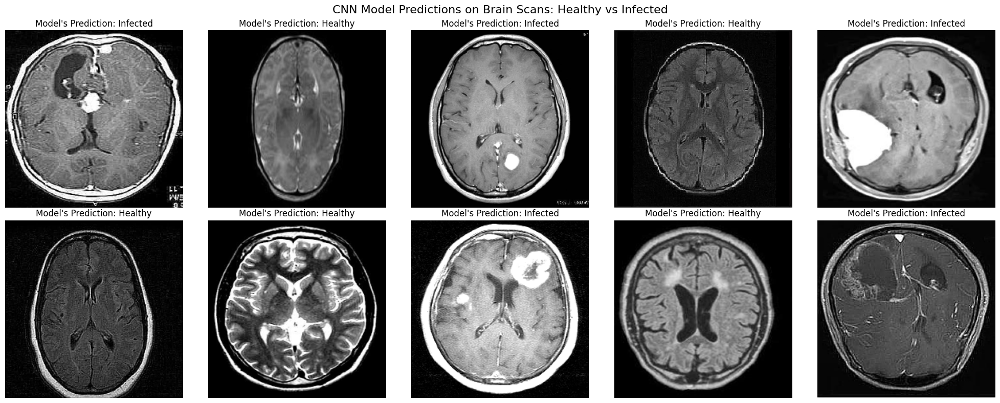

In [ ]:
# @title CNN Model Predictions on Brain Scans: Healthy vs Infected
import keras
from keras.optimizers import RMSprop
import matplotlib.pyplot as plt

# Load the pre-trained Keras model
keras_model = keras.models.load_model('/content/drive/MyDrive/CNN_model_best.h5')

keras_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                    loss='sparse_categorical_crossentropy',
                    metrics=['acc'])

X_pred_test = X_test[0:10]

predictions = keras_model.predict(X_pred_test)

predictions = predictions.argmax(axis=-1)

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions)

# Map numerical predictions to corresponding labels
pred_labels = ['Healthy' if i == 0 else 'Infected' for i in predictions]
print(pred_labels)

import matplotlib.pyplot as plt

def pre_visualization(data, predictions, cols=5):
    """
    Visualizes the predictions alongside the images in a grid layout.

    Parameters:
    data (list): List of image data.
    predictions (list): List of predictions corresponding to the data.
    cols (int): Number of columns in the grid display.
    """
    rows = len(data) // cols + (1 if len(data) % cols else 0)

    plt.figure(figsize=(cols * 4, rows * 4))

    for i, (image, pred) in enumerate(zip(data, predictions), 1):
        plt.subplot(rows, cols, i)
        # Convert the image to the correct format if it's not already
        if isinstance(image, np.ndarray):
            img_display = image
        else:
            img_display = image.numpy()

        plt.imshow(img_display.reshape(224, 224, 3))
        plt.title(f"Model's Prediction: {pred}")
        plt.axis('off')
    plt.suptitle("CNN Model Predictions on Brain Scans: Healthy vs Infected", fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize the predictions
pre_visualization(X_pred_test, pred_labels)

### RESNET50 Model Implementation

In [ ]:
# @title creating data augmentations for the resnet50
from keras.applications.resnet50 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

data_gen = ImageDataGenerator(
    rescale=1./255
)

def load_and_augment_image_for_resnet(file_path):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    img = preprocess_input(img)
    img = img.reshape((1,) + img.shape)
    return next(data_gen.flow(img))[0]

training_data['resnet_augmented_image'] = training_data['image'].apply(load_and_augment_image)

In [ ]:
# @title numpy to tensor conversion
import tensorflow as tf
X_train, X_test, y_train, y_test = train_test_split(training_data['resnet_augmented_image'], training_data['label'], test_size=0.2, shuffle=True, random_state=42)

X_train_array = np.stack(X_train.to_numpy())
X_train_array = X_train_array.astype(np.float32)
X_train = tf.convert_to_tensor(X_train_array)
print("X_train Tensor Shape:", X_train.shape)
X_test_array = np.stack(X_test.to_numpy())
X_test_array = X_test_array.astype(np.float32)
X_test = tf.convert_to_tensor(X_test_array)
# Check the shape
print("X_test Tensor Shape:", X_test.shape)

X_train Tensor Shape: (2400, 224, 224, 3)
X_test Tensor Shape: (600, 224, 224, 3)


In [ ]:
# @title Resnet-50 model building & Training
from keras.applications.resnet50 import ResNet50
from keras.layers import GlobalAveragePooling2D, Dense
from keras.models import Model


def build_resnet50_model(input_shape=(224, 224, 3)):

    resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    x = resnet50.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=resnet50.input, outputs=predictions)

    for layer in resnet50.layers:
        layer.trainable = False

    return model


# Optimized callbacks
es = EarlyStopping(monitor='val_loss', mode='min', patience=5, restore_best_weights=True, verbose=1)
checkpoint_cb = ModelCheckpoint("Brain_model_best.h5", save_best_only=True, save_freq='epoch')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5, mode='min', verbose=1)


# Instantiate the ResNet50 model
resnet50_model = build_resnet50_model()

# Compile the ResNet50 model
resnet50_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                       loss='binary_crossentropy',
                       metrics=['accuracy'])

# Train the ResNet50 model
history = resnet50_model.fit(X_train, y_train,
                             validation_data=(X_test, y_test),
                             epochs=20,
                             batch_size=10,
                             callbacks=[es, checkpoint_cb, reduce_lr])

94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/20
240/240 [==============================] - ETA: 0s - loss: 0.5945 - accuracy: 0.6812

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


240/240 [==============================] - 608s 3s/step - loss: 0.5945 - accuracy: 0.6812 - val_loss: 0.5565 - val_accuracy: 0.7183 - lr: 1.0000e-04
Epoch 2/20
240/240 [==============================] - 597s 2s/step - loss: 0.5364 - accuracy: 0.7292 - val_loss: 0.5030 - val_accuracy: 0.7583 - lr: 1.0000e-04
Epoch 3/20
240/240 [==============================] - 584s 2s/step - loss: 0.5069 - accuracy: 0.7563 - val_loss: 0.5106 - val_accuracy: 0.7467 - lr: 1.0000e-04
Epoch 4/20
240/240 [==============================] - 583s 2s/step - loss: 0.5021 - accuracy: 0.7575 - val_loss: 0.5255 - val_accuracy: 0.7367 - lr: 1.0000e-04
Epoch 5/20
240/240 [==============================] - 588s 2s/step - loss: 0.4907 - accuracy: 0.7700 - val_loss: 0.4781 - val_accuracy: 0.7667 - lr: 1.0000e-04
Epoch 6/20
240/240 [==============================] - 585s 2s/step - loss: 0.4833 - accuracy: 0.7729 - val_loss: 0.4861 - val_accuracy: 0.7550 - lr: 1.0000e-04
Epoch 7/20
240/240 [==============================]

In [ ]:
# @title Viewing Model Architecture
resnet50_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [ ]:
# @title Saving Model History for Visualisation
import json
history_data = history.history

for key in history_data:
    history_data[key] = [float(val) for val in history_data[key]]

with open('resnet_model_history.json', 'w') as f:
    json.dump(history_data, f)

with open('resnet_model_history.json', 'r') as f:
    loaded_history = json.load(f)

In [ ]:
# @title Saving Resnet50 Model
# Save the entire model to a HDF5 file.
# The '.h5' extension indicates that the model should be saved in Keras format as HDF5.
resnet50_model.save('resnet50_model_complete.h5')


1/1 [==============================] - 3s 3s/step
Prediction Key: 0 = 'Healthy', 1 = 'Infected'
[1 0 1 0 1 0 1 1 0 1]
['Infected', 'Healthy', 'Infected', 'Healthy', 'Infected', 'Healthy', 'Healthy', 'Infected', 'Healthy', 'Infected']


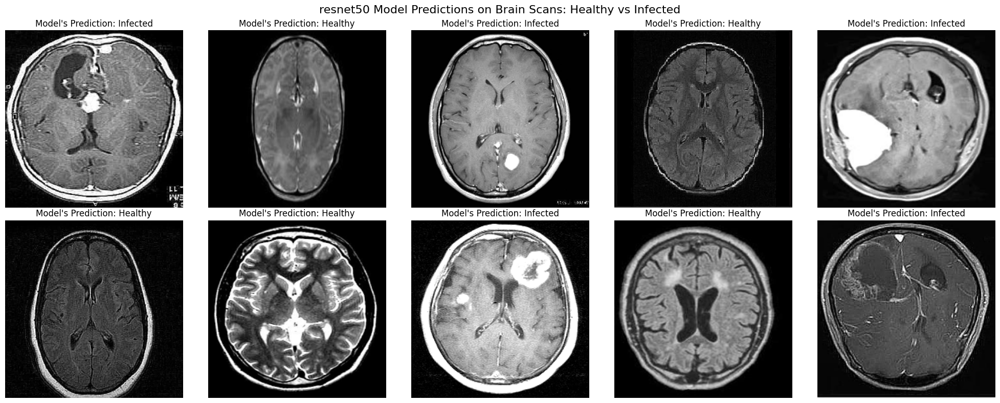

In [ ]:
# @title Prediction Using restNet50 Model

restNet50_model = load_model("/content/drive/MyDrive/resnet50_model_complete.h5")
restNet50_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                       loss='binary_crossentropy',
                       metrics=['accuracy'])

X_pred_test_restnet50 = X_test[0:10]

# Predict using the restNet50 model
predictions_restnet50 = restNet50_model.predict(X_pred_test_restnet50)

# For binary classification, threshold predictions at 0.5
predictions_restnet50 = (predictions_restnet50 > 0.5).astype(int).flatten()

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions_restnet50)

# Map numerical predictions to corresponding labels
predictions_restnet50 = ['Healthy' if i == 0 else 'Infected' for i in predictions_vgg]
print(predictions_restnet50)

def pre_visualization(data, predictions, cols=5):
    """
    Visualizes the predictions alongside the images in a grid layout.

    Parameters:
    data (list): List of image data.
    predictions (list): List of predictions corresponding to the data.
    cols (int): Number of columns in the grid display.
    """
    rows = len(data) // cols + (1 if len(data) % cols else 0)

    plt.figure(figsize=(cols * 4, rows * 4))

    for i, (image, pred) in enumerate(zip(data, predictions), 1):
        plt.subplot(rows, cols, i)
        # Convert the image to the correct format if it's not already
        if isinstance(image, np.ndarray):
            img_display = image
        else:
            img_display = image.numpy()

        plt.imshow(img_display.reshape(224, 224, 3))
        plt.title(f"Model's Prediction: {pred}")
        plt.axis('off')
    plt.suptitle("resnet50 Model Predictions on Brain Scans: Healthy vs Infected", fontsize=16)
    plt.tight_layout()
    plt.show()

pre_visualization(X_pred_test_restnet50, predictions_restnet50)



## CNN, VGG16 & ResNet50 Models - Collective & Comprehensive Evaluation

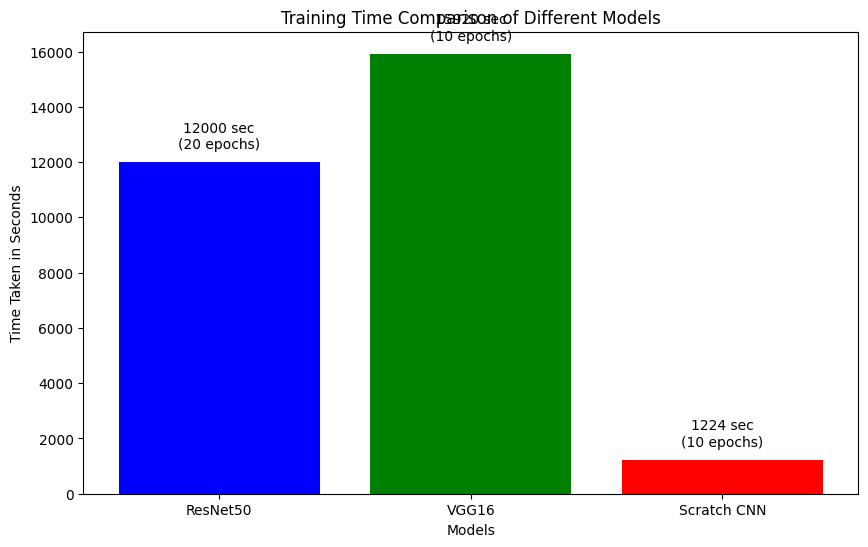

In [ ]:
# @title Trainig Time Graph
import matplotlib.pyplot as plt

# Data for plotting
models = ['ResNet50', 'VGG16', 'Scratch CNN']
 # Time in seconds
time_taken = [12000, 15920, 1224]
# Number of epochs for each model
epochs = [20, 10, 10]

plt.figure(figsize=(10, 6))
plt.bar(models, time_taken, color=['blue', 'green', 'red'])

plt.title('Training Time Comparison of Different Models')
plt.xlabel('Models')
plt.ylabel('Time Taken in Seconds')
plt.xticks(models)
for i, time in enumerate(time_taken):
    plt.text(i, time + 500, f'{time} sec\n({epochs[i]} epochs)', ha='center')

plt.show()


In [ ]:
# @title Models: Trainig and Validation Graphs

#VGG16 - Model
# Load the history of VGG16 1st Iteration data from the JSON file
with open('/content/drive/MyDrive/vggnet_model_history.json', 'r') as f:
    loaded_VGG161_history = json.load(f)

# Load the history of VGG16 2nd Iteration data from the JSON file
with open('/content/drive/MyDrive/vggnet_model_history2.json', 'r') as f:
    loaded_VGG162_history = json.load(f)

# Initialize a new history dictionary
VGG16_history = {}
for key in loaded_VGG161_history.keys():
    VGG16_history[key] = loaded_VGG161_history[key] + loaded_VGG162_history[key]

# Load the history of CNN data from the JSON file
with open('/content/drive/MyDrive/CNN_model_history.json', 'r') as f:
    loaded_CNN_history = json.load(f)

# Load the history of ResNet50 data from the JSON file
with open('/content/drive/MyDrive/resnet_model_history.json', 'r') as f:
    loaded_history = json.load(f)

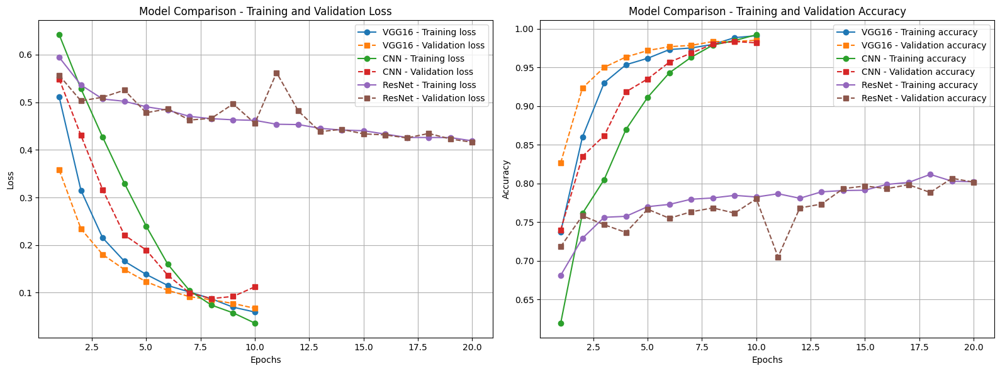

In [ ]:
# @title Models: Trainig and Validation Graphs

def plot_history_improved(models, title):
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    for model_name, history in models.items():
        epochs = range(1, len(history['loss']) + 1)
        plt.plot(epochs, history['loss'], 'o-', label=f'{model_name} - Training loss')
        plt.plot(epochs, history['val_loss'], 's--', label=f'{model_name} - Validation loss')
    plt.title(f'{title} - Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    for model_name, history in models.items():
        epochs = range(1, len(history['accuracy']) + 1)
        plt.plot(epochs, history['accuracy'], 'o-', label=f'{model_name} - Training accuracy')
        plt.plot(epochs, history['val_accuracy'], 's--', label=f'{model_name} - Validation accuracy')
    plt.title(f'{title} - Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_history_improved({'VGG16': VGG16_history, 'CNN': loaded_CNN_history, 'ResNet': loaded_history}, 'Model Comparison')


In [ ]:
# @title Prediction Performance
# RestNet50 Model
restNet50_model = load_model("/content/drive/MyDrive/resnet50_model_complete.h5")
restNet50_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                       loss='binary_crossentropy',
                       metrics=['accuracy'])

X_pred_test_restnet50 = X_test

predictions_restnet50 = restNet50_model.predict(X_pred_test_restnet50)

predictions_restnet50 = (predictions_restnet50 > 0.5).astype(int).flatten()

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions_restnet50)
print("*" * 80)
print("Prediction for the ResNet50 Complete")
print("*" * 80)

# CNN Model
keras_model = keras.models.load_model('/content/drive/MyDrive/CNN_model_best.h5')

keras_model.compile(optimizer=RMSprop(learning_rate=1e-4),
                    loss='sparse_categorical_crossentropy',
                    metrics=['acc'])

X_pred_test = X_test
predictions = keras_model.predict(X_pred_test)

predictions = predictions.argmax(axis=-1)

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions)
print("*" * 80)
print("Prediction for the CNN Complete")
print("*" * 80)

# VGG16 Model
vgg_model = load_model("/content/drive/MyDrive/vgg16_final_model.h5")
vgg_model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

X_pred_test_vgg = X_test

predictions_vgg = vgg_model.predict(X_pred_test_vgg)

predictions_vgg = (predictions_vgg > 0.5).astype(int).flatten()

print("Prediction Key: 0 = 'Healthy', 1 = 'Infected'")
print(predictions_vgg)
print("*" * 80)
print("Prediction for the VGG16 Complete")
print("*" * 80)


print("Sizes of all the predictions: ")
print("predictions_restnet50: ", len(predictions_restnet50))
print("predictions_cnn: ", len(predictions))
print("pred_labels_vgg: ", len(predictions_vgg))
#The variable y_test contains values that contain the original true values for the x-test samples

19/19 [==============================] - 143s 8s/step
Prediction Key: 0 = 'Healthy', 1 = 'Infected'
[1 0 1 0 1 0 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 0 0 0 1
 0 0 0 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1
 0 0 0 1 1 0 1 1 0 1 1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 1 1
 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 1 1 1 1 1
 0 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1 0 0 0 0 1 1 0
 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 1
 1 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 1 1 1 1 0 1
 0 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 0 0 1
 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 1 1
 0 0 1 1 1 1 0 0 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 0
 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0


In [ ]:
# @title Confusion Matrix 7 Classification Report Calculation report
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_recall_fscore_support

def nums_to_labels(preds):
    return ['Healthy' if i == 0 else 'Infected' for i in preds]

def calculate_metrics(y_true, y_pred, model_name):
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    # Classification Report for Precision, Recall, and F1-Score
    cr = classification_report(y_true, y_pred, target_names=['Healthy', 'Infected'])
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred)

    print(f"{model_name} Model Metrics")
    print("-" * 60)
    print("Confusion Matrix:\n", cm)
    print("\nClassification Report:\n", cr)
    print("-" * 60)

    # Extract TP, FP, FN, TN
    tn, fp, fn, tp = cm.ravel()

    # Extract precision, recall, and F1-score for each class
    precision_healthy, precision_infected = precision
    recall_healthy, recall_infected = recall
    f1_score_healthy, f1_score_infected = f1_score

    return {
        'cm': cm, 'tp': tp, 'fp': fp, 'fn': fn, 'tn': tn,
        'precision': (precision_healthy, precision_infected),
        'recall': (recall_healthy, recall_infected),
        'f1_score': (f1_score_healthy, f1_score_infected)
    }

resnet50_metrics = calculate_metrics(y_test, predictions_restnet50, "ResNet50")
cnn_metrics = calculate_metrics(y_test, predictions, "CNN")
vgg16_metrics = calculate_metrics(y_test, predictions_vgg, "VGG16")


ResNet50 Model Metrics
------------------------------------------------------------
Confusion Matrix:
 [[253  60]
 [ 59 228]]

Classification Report:
               precision    recall  f1-score   support

     Healthy       0.81      0.81      0.81       313
    Infected       0.79      0.79      0.79       287

    accuracy                           0.80       600
   macro avg       0.80      0.80      0.80       600
weighted avg       0.80      0.80      0.80       600

------------------------------------------------------------
CNN Model Metrics
------------------------------------------------------------
Confusion Matrix:
 [[307   6]
 [  6 281]]

Classification Report:
               precision    recall  f1-score   support

     Healthy       0.98      0.98      0.98       313
    Infected       0.98      0.98      0.98       287

    accuracy                           0.98       600
   macro avg       0.98      0.98      0.98       600
weighted avg       0.98      0.98      0.98

In [ ]:
# @title ResNet50, VGG16 & CNN Models results processing
# Extracting TP, FP, FN, TN for each model
TP1, FP1, FN1, TN1 = resnet50_metrics['tp'], resnet50_metrics['fp'], resnet50_metrics['fn'], resnet50_metrics['tn']
TP2, FP2, FN2, TN2 = cnn_metrics['tp'], cnn_metrics['fp'], cnn_metrics['fn'], cnn_metrics['tn']
TP3, FP3, FN3, TN3 = vgg16_metrics['tp'], vgg16_metrics['fp'], vgg16_metrics['fn'], vgg16_metrics['tn']

# Extracting precision, recall, and F1-score for each model
P1H, P1I = resnet50_metrics['precision']
R1H, R1I = resnet50_metrics['recall']
F1H, F1I = resnet50_metrics['f1_score']

P2H, P2I = cnn_metrics['precision']
R2H, R2I = cnn_metrics['recall']
F2H, F2I = cnn_metrics['f1_score']

P3H, P3I = vgg16_metrics['precision']
R3H, R3I = vgg16_metrics['recall']
F3H, F3I = vgg16_metrics['f1_score']

# Calculating accuracy for each model
accuracy_resnet50 = (TP1 + TN1) / (TP1 + FP1 + FN1 + TN1)
accuracy_cnn = (TP2 + TN2) / (TP2 + FP2 + FN2 + TN2)
accuracy_vgg16 = (TP3 + TN3) / (TP3 + FP3 + FN3 + TN3)

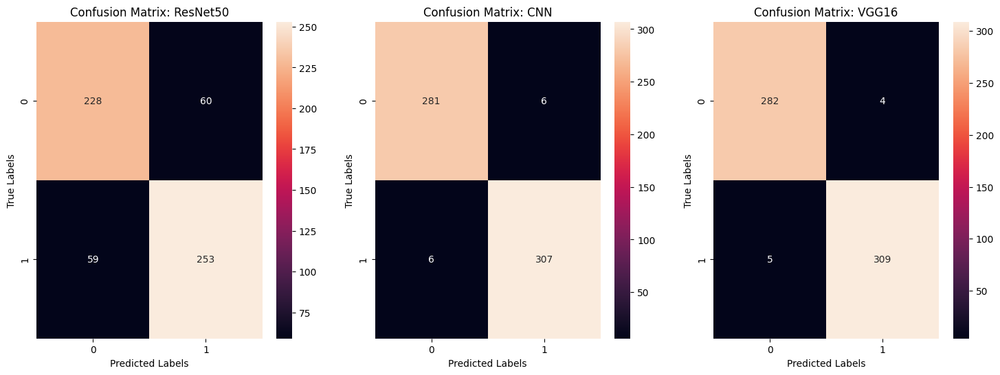

In [ ]:
# @title Confusion Matrix Plots
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

cm_resnet50 = np.array([[TP1, FP1], [FN1, TN1]])
cm_cnn = np.array([[TP2, FP2], [FN2, TN2]])
cm_vgg16 = np.array([[TP3, FP3], [FN3, TN3]])

models = ['ResNet50', 'CNN', 'VGG16']
cms = [cm_resnet50, cm_cnn, cm_vgg16]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, (model, cm) in enumerate(zip(models, cms)):
    sns.heatmap(cm, annot=True, ax=axes[i], fmt='g')
    axes[i].set_title(f'Confusion Matrix: {model}')
    axes[i].set_xlabel('Predicted Labels')
    axes[i].set_ylabel('True Labels')

plt.show()


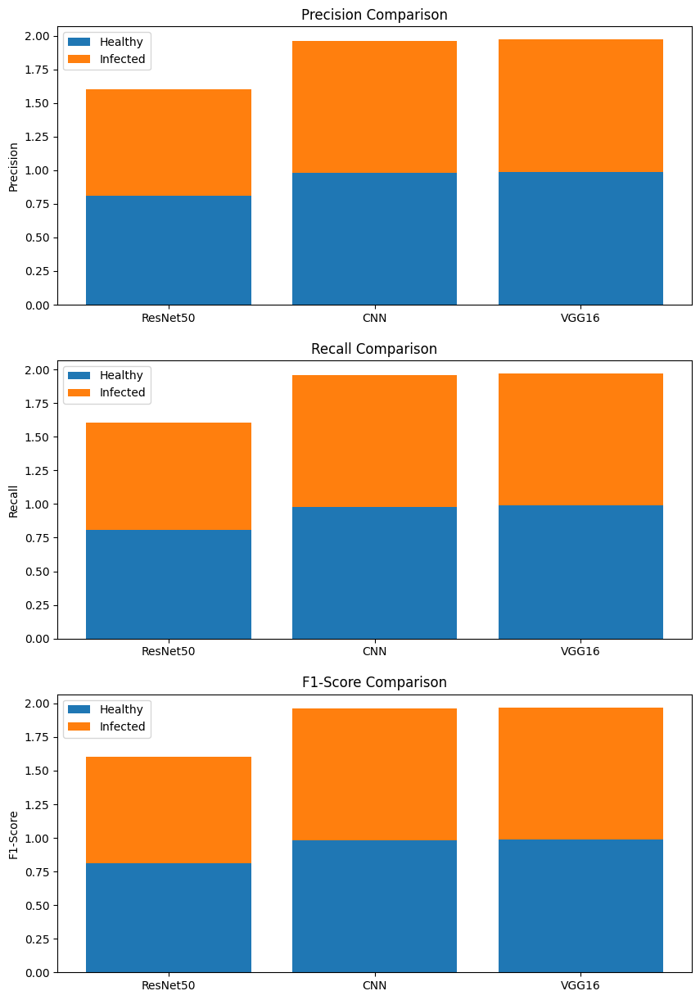

In [ ]:
# @title Models Precision & Recall Plots

metrics_resnet50 = {'Precision': [P1H, P1I], 'Recall': [R1H, R1I], 'F1-Score': [F1H, F1I]}
metrics_cnn = {'Precision': [P2H, P2I], 'Recall': [R2H, R2I], 'F1-Score': [F2H, F2I]}
metrics_vgg16 = {'Precision': [P3H, P3I], 'Recall': [R3H, R3I], 'F1-Score': [F3H, F3I]}

fig, axes = plt.subplots(3, 1, figsize=(10, 15))
for i, metric in enumerate(['Precision', 'Recall', 'F1-Score']):
    res = [metrics_resnet50[metric], metrics_cnn[metric], metrics_vgg16[metric]]
    axes[i].bar(models, [r[0] for r in res], label='Healthy')
    axes[i].bar(models, [r[1] for r in res], bottom=[r[0] for r in res], label='Infected')
    axes[i].set_title(f'{metric} Comparison')
    axes[i].set_ylabel(metric)
    axes[i].legend()

plt.show()


In [ ]:
# @title Models Accuracy Plot
import plotly.graph_objects as go

accuracies = [accuracy_resnet50, accuracy_cnn, accuracy_vgg16]
models = ['ResNet50', 'CNN', 'VGG16']

colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

fig = go.Figure(data=[
    go.Bar(x=models, y=accuracies, marker_color=colors)
])

fig.update_layout(
    title='Model Accuracy Comparison',
    xaxis=dict(title='Models'),
    yaxis=dict(title='Accuracy'),
    showlegend=False,
    template='plotly_white'
)

fig.show()


In [ ]:
# @title TITLE

from IPython.display import HTML, display

def title(title, font_size=24, color='navy', font_family='Arial, sans-serif', shadow='2px 2px 4px grey'):

    display(HTML(f"<h1 style='color: {color}; font-size: {font_size}px; text-align: center; font-family: {font_family}; text-shadow: {shadow};'>{title}</h1>"))


title("Image Classification for Disease Detection - Pneumonia & TuberCulosis")


---

### **Project Title:** Image Classification for Disease Detection

---

#### **Motivation**

**Objective:**

Develop a machine learning system to accurately and efficiently detect and classify diseases in medical images, such as X-rays and Brain Magnetic Resonance Imaging (MRI) scans.

**Key Points:**

1. **Enhance Medical Diagnostics:**
   - Leverage machine learning to improve the precision and speed of medical image analysis.
   - Contribute to better patient care and healthcare outcomes.

2. **Data Collection and Preprocessing:**
   - Assemble a comprehensive dataset of labeled medical images.
   - Perform data preprocessing, including resizing, normalization, and augmentation.

3. **Deep Learning Techniques:**
   - Utilize Convolutional Neural Networks (CNNs) for image classification.

4. **Impact:**
   - Revolutionize disease detection and diagnosis with advanced ML capabilities.
   - Support healthcare professionals in delivering more accurate and timely diagnoses.

#**GOAL**

**To conduct a comparative study of various deep learning frameworks and architectures, focusing on TensorFlow, Keras, and PyTorch, in the context of disease detection using medical images. The study will assess the performance, efficiency, and results of different models and training approaches, including Convolutional Neural Networks (CNNs).**

1. **Introduction**
   - Overview of the Project
   - Objectives and Goals

2. **Project Setup**
   - Importing Necessary Libraries
   - Data Importing and Handling

3. **Data Preprocessing and Exploration**
   - Dataset Description
   - Data Preprocessing Steps
   - Exploratory Data Analysis (EDA)

4. **Model Development**
   - Model Architecture
   - Training and Validation
   - Performance Metrics and Evaluation
   - Model Saving and Loading

6. **Model Implementation and Testing**
   - Data Splitting (Training and Testing)
   - Model Training
   - Evaluation of Model Performance
     - Training and Validation Accuracy
     - Loss and Accuracy Over Epochs
     - Confusion Matrix and Classification Report

7. **Sample Predictions and Analysis**
   - Displaying Sample Predictions
   
8. **Advanced Techniques and Future Works**
   - Implementing RGB Image Processing
   - Potential Use of Advanced Models (e.g., VGG, ResNet)
   - Future Directions for the Project


**Abnormalities in chest X-ray images play a crucial role in diagnosing and understanding the extent and nature of respiratory diseases like pneumonia and tuberculosis (TB). Here's how these abnormalities are indicative of each condition:**

<table>
    <tr>
        <td style="text-align:center;">
            <img src="https://www.uptodate.com/contents/images/PI/55943/PneumoniaanatomyPI.jpg" alt="Pneumonia" style="width: 100%; max-width: 300px; display: block; margin-left: auto; margin-right: auto;"/>
            <div style="margin-top: 10px; font-size: 18px; font-weight: bold;">Pneumonia</div>
        </td>
        <td style="text-align:center;">
            <img src="https://cdn2.vectorstock.com/i/1000x1000/09/86/tuberculosis-tb-infection-in-lungs-patients-vector-32260986.jpg" alt="Tuberculosis" style="width: 100%; max-width: 300px; display: block; margin-left: auto; margin-right: auto;"/>
            <div style="margin-top: 10px; font-size: 18px; font-weight: bold;">Tuberculosis (TB)</div>
        </td>
    </tr>
</table>


### Pneumonia-Related Abnormalities in Chest X-Rays

1. **Opacities**: In pneumonia, chest X-rays typically show areas of opacity or white spots in the lungs. These opacities are due to the filling of air sacs with fluid or pus.

2. **Lobar Consolidation**: This is a commson feature in bacterial pneumonia, where an entire lobe of the lung appears solid on the X-ray due to the accumulation of infectious agents and white blood cells.

3. **Interstitial Patterns**: In viral or mycoplasma pneumonia, the pattern may be more diffuse and spread across both lungs, showing an interstitial pattern that indicates inflammation of the lung's supportive structure.

4. **Cavitation**: Rarely, pneumonia can lead to cavitation, where a hollow area forms in the lung, which may be visible on an X-ray.

5. **Pleural Effusion**: In some cases, pneumonia can cause a pleural effusion, which is the accumulation of fluid between the layers of tissue that line the lungs and chest cavity.

### Tuberculosis-Related Abnormalities in Chest X-Rays

1. **Upper Lung Field Abnormalities**: TB commonly affects the upper lobes of the lungs. The X-ray may show patchy or nodular opacities in these areas.

2. **Cavitation**: A hallmark of active pulmonary TB is the presence of cavities. These are rounded, hollow areas that develop due to the destruction of lung tissue by the infection.

3. **Miliary Patterns**: In some TB cases, especially disseminated TB, numerous tiny nodules spread throughout the lung fields, resembling millet seeds, hence the name "miliary tuberculosis."

4. **Calcification and Scarring**: Healed TB can leave scars or calcified nodules in the lungs, which are detectable on X-rays.

5. **Pleural Effusion**: TB can also cause effusion, similar to pneumonia, especially in reactivation or secondary TB.

### Diagnostic Significance

- **Disease Identification**: These abnormalities help differentiate between various lung diseases, as each has characteristic patterns on X-ray images.

- **Disease Progression and Severity**: The extent of these abnormalities can indicate the stage and severity of the disease, guiding treatment decisions.

- **Treatment Monitoring**: Serial chest X-rays can be used to monitor the response to treatment. Improvement or worsening of the abnormalities can indicate the effectiveness or failure of therapy.

- **Detection of Complications**: Abnormalities in chest X-rays also help in identifying complications arising from these diseases, such as lung collapse or the spread of infection beyond the lungs.

In [ ]:
# @title Import Neccessary Libraries
# General Purpose and System Libraries
import os
import gc

# Data Handling and Analysis Libraries
import pandas as pd
import numpy as np

# Machine Learning and Data Modeling Libraries
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten
import sklearn.model_selection
import sklearn.metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Image Processing Library
import cv2

# Plotting and Visualization Library
import matplotlib.pyplot as plt

# Validation and Testing Library
from traitlets import validate


In [ ]:
!unzip -q /content/drive/MyDrive/ML_PROJECT_FILES.zip

In [ ]:
# @title Data Importing
!pip install kaggle

from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Making sure we have the .kaggle directory
!mkdir -p ~/.kaggle

# Copy the kaggle.json to this directory
!cp kaggle.json ~/.kaggle/

# Change the permission of the file
!chmod 600 ~/.kaggle/kaggle.json


!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

!kaggle datasets download -d tawsifurrahman/tuberculosis-tb-chest-xray-dataset

!unzip -q /content/chest-xray-pneumonia.zip
!unzip -q /content/tuberculosis-tb-chest-xray-dataset.zip

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 62 bytes
100% 2.29G/2.29G [00:23<00:00, 32.7MB/s]
100% 2.29G/2.29G [00:23<00:00, 104MB/s] 
 98% 650M/663M [00:06<00:00, 145MB/s]
100% 663M/663M [00:06<00:00, 108MB/s]


### Data Handling and Data Preprocessing


In [ ]:
# @title (Pneumonia & Normal) - chest X-rays dataset - [5846 - Images]
def set_folder_paths(base_folder):
    """
    Sets and returns the paths for training, testing, and validation folders,
    including subfolders for normal and pneumonia cases.

    Parameters:
    base_folder (str): The base directory where the chest x-ray folders are located.

    Returns:
    dict: A dictionary containing all the folder paths.
    """
    training_path = base_folder + "/train"
    testing_path = base_folder + "/test"
    validation_path = base_folder + "/val"

    path_dict = {
        "test_normal": testing_path + "/NORMAL/",
        "test_pneumonia": testing_path + "/PNEUMONIA/",
        "train_normal": training_path + "/NORMAL/",
        "train_pneumonia": training_path + "/PNEUMONIA/",
        "val_normal": validation_path + "/NORMAL/",
        "val_pneumonia": validation_path + "/PNEUMONIA/"
    }
    gc.collect()
    return path_dict
def get_file_names(base_folder):
    """
    Retrieves the names of files in the train, test, and validate folders for both normal and pneumonia cases.

    Parameters:
    base_folder (str): The base directory where the chest x-ray folders are located.

    Returns:
    dict: A dictionary containing lists of file names for each folder.
    """
    paths = set_folder_paths(base_folder)

    filenames_dict = {
        "train_normal_files": os.listdir(paths["train_normal"]),
        "train_pneumonia_files": os.listdir(paths["train_pneumonia"]),
        "test_normal_files": os.listdir(paths["test_normal"]),
        "test_pneumonia_files": os.listdir(paths["test_pneumonia"]),
        "val_normal_files": os.listdir(paths["val_normal"]),
        "val_pneumonia_files": os.listdir(paths["val_pneumonia"])
    }
    gc.collect()
    return filenames_dict, paths

def create_dataframes(base_folder):

    """
    Creates and processes dataframes for chest x-ray images, categorized into normal and pneumonia.

    Parameters:
        base_folder (str): The base directory where the chest x-ray folders are located.

    Returns:
        DataFrame: A shuffled dataframe containing image paths, labels, and resized images.
    """

    filenames_dict, paths_dict = get_file_names(base_folder)

    # Categories and their corresponding labels
    categories = {
        'train_normal_files': 0,
        'train_pneumonia_files': 2,
        'test_normal_files': 0,
        'test_pneumonia_files': 2,
        'val_normal_files': 0,
        'val_pneumonia_files': 2
    }


    dataframes = []
    for category, label in categories.items():
        df = pd.DataFrame(filenames_dict[category], columns=["file_paths"])
        df["category"] = label
        path_key = category.split('_files')[0]
        df["file_paths"] = paths_dict[path_key] + df["file_paths"]
        dataframes.append(df)

    # Concatenate and shuffle all dataframes
    combined_df = pd.concat(dataframes, ignore_index=True)
    shuffled_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)
    shuffled_df["resized_images"] = shuffled_df['file_paths'].apply(lambda path: cv2.resize(cv2.imread(path, 0), (224, 224)))
    gc.collect()

    return shuffled_df

all_folder = "/content/chest_xray"

df_pneumonia = create_dataframes(all_folder)
print('*' * 80)
print("Extracted Pneumonia Images Dataset and Stored it in the Data Frame - df_pneumonia")
print('*' * 80)
print("df_pneumonia = create_dataframes(all_folder)")
print('*' * 80)
print("df_pneumonia.shape: ", df_pneumonia.shape)
print('*' * 80)

********************************************************************************
Extracted Pneumonia Images Dataset and Stored it in the Data Frame - df_pneumonia
********************************************************************************
df_pneumonia = create_dataframes(all_folder)
********************************************************************************
df_pneumonia.shape:  (5856, 3)
********************************************************************************


In [ ]:
# @title (TB & Normal) - chest X-rays dataset - [4200 - Images]
import pandas as pd
import os
import cv2
import gc

def create_tb_dataframes(base_folder):
    """
    Creates dataframes for normal and tuberculosis images and processes them.

    Parameters:
    base_folder (str): The base directory where the TB Chest Radiography Database is located.

    Returns:
    DataFrame: A shuffled dataframe containing image paths, labels, and processed images.
    """
    categories = {
        "Normal": 1,
        "Tuberculosis": 3
    }

    dataframes = []
    for category, label in categories.items():
        folder_path = os.path.join(base_folder, category)
        images_list = os.listdir(folder_path)
        df = pd.DataFrame(images_list, columns=["file_paths"])
        df["category"] = label
        df["file_paths"] = df["file_paths"].apply(lambda x: os.path.join(folder_path, x))
        dataframes.append(df)

    combined_df = pd.concat(dataframes, ignore_index=True)
    shuffled_df = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)
    shuffled_df["resized_images"] = shuffled_df['file_paths'].apply(lambda path: cv2.resize(cv2.imread(path, 0), (224, 224)))
    gc.collect()

    return shuffled_df

data2_path = "/content/TB_Chest_Radiography_Database"
df_tb = create_tb_dataframes(data2_path)
print('*' * 80)
print("Extracted TuberCulosis Images Dataset and Stored it in the Data Frame - df_tb")
print('*' * 80)
print("df_tb = create_dataframes(all_folder)")
print('*' * 80)
print("df_tb.shape: ", df_tb.shape)
print('*' * 80)

********************************************************************************
Extracted TuberCulosis Images Dataset and Stored it in the Data Frame - df_tb
********************************************************************************
df_tb = create_dataframes(all_folder)
********************************************************************************
df_tb.shape:  (4200, 3)
********************************************************************************


In [ ]:
# @title Combining and Shuffling the DataSets
# Combine pneumonia and tuberculosis dataframes
combine_data = pd.concat([df_pneumonia, df_tb], ignore_index=True)
# The pd.concat function concatenates the df_pneumonia and df_tb dataframes into one.
# The ignore_index=True parameter is used to reindex the combined dataframe.

# Shuffle the combined dataframe
combine_data = combine_data.sample(frac=1, random_state=42).reset_index(drop=True)
# The sample method is used to shuffle the dataframe.
# The frac=1 parameter ensures that all rows are included in the shuffle.
# The random_state=42 parameter is used to ensure that the shuffle is reproducible.
# The reset_index(drop=True) resets the index of the shuffled dataframe and drops the old index.

# Display the final combined and shuffled dataframe
combine_data


,file_paths,category,resized_images
0,/content/TB_Chest_Radiography_Database/Tubercu...,3,"[[198, 219, 214, 212, 213, 214, 214, 216, 219,..."
1,/content/chest_xray/train/NORMAL/NORMAL2-IM-11...,0,"[[0, 0, 1, 173, 184, 181, 192, 183, 178, 166, ..."
2,/content/chest_xray/train/PNEUMONIA/person1502...,2,"[[7, 8, 6, 8, 8, 8, 7, 6, 6, 7, 5, 5, 4, 6, 4,..."
3,/content/TB_Chest_Radiography_Database/Tubercu...,3,"[[0, 0, 0, 0, 0, 1, 2, 0, 1, 1, 0, 0, 0, 0, 1,..."
4,/content/chest_xray/train/PNEUMONIA/person279_...,2,"[[67, 74, 80, 83, 113, 114, 134, 129, 131, 130..."
...,...,...,...
10051,/content/chest_xray/train/PNEUMONIA/person444_...,2,"[[61, 67, 66, 67, 66, 71, 67, 72, 69, 73, 77, ..."
10052,/content/chest_xray/train/PNEUMONIA/person339_...,2,"[[19, 20, 30, 24, 33, 62, 25, 34, 26, 18, 19, ..."
10053,/content/chest_xray/train/PNEUMONIA/person1639...,2,"[[78, 81, 80, 83, 81, 82, 91, 98, 105, 100, 10..."
10054,/content/chest_xray/train/NORMAL/IM-0523-0001....,0,"[[45, 53, 63, 68, 77, 80, 90, 88, 93, 95, 93, ..."


### EDA - EXPLORATORY DATA ANALYSIS

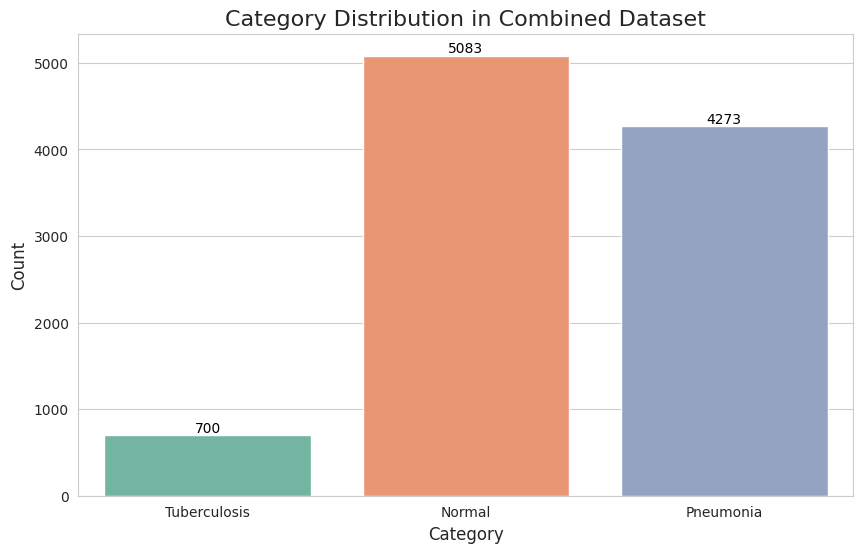

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Mapping categories to their names
category_names = {0: 'Normal', 1: 'Normal', 2: 'Pneumonia', 3: 'Tuberculosis'}

def plot_category_distribution(df, title):
    df['category_name'] = df['category'].map(category_names)

    plt.figure(figsize=(10, 6))
    sns.set_style("whitegrid")
    ax = sns.countplot(x='category_name', data=df, palette="Set2")

    plt.title(title, fontsize=16)
    plt.xlabel('Category', fontsize=12)
    plt.ylabel('Count', fontsize=12)

    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.show()

plot_category_distribution(combine_data, "Category Distribution in Combined Dataset")


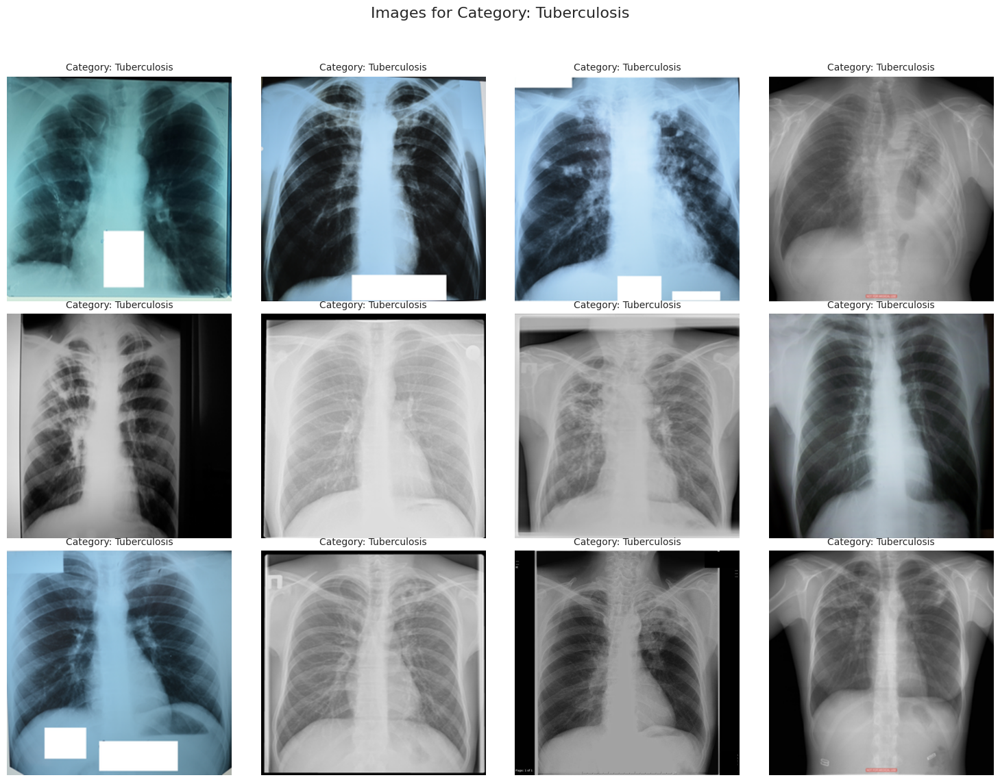

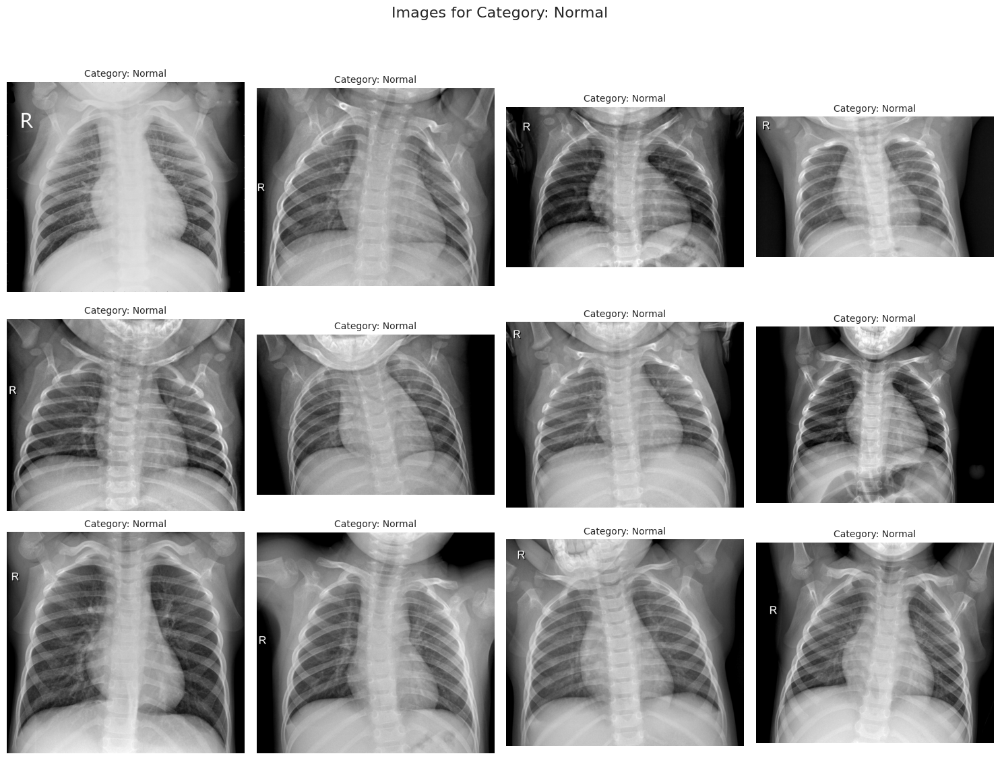

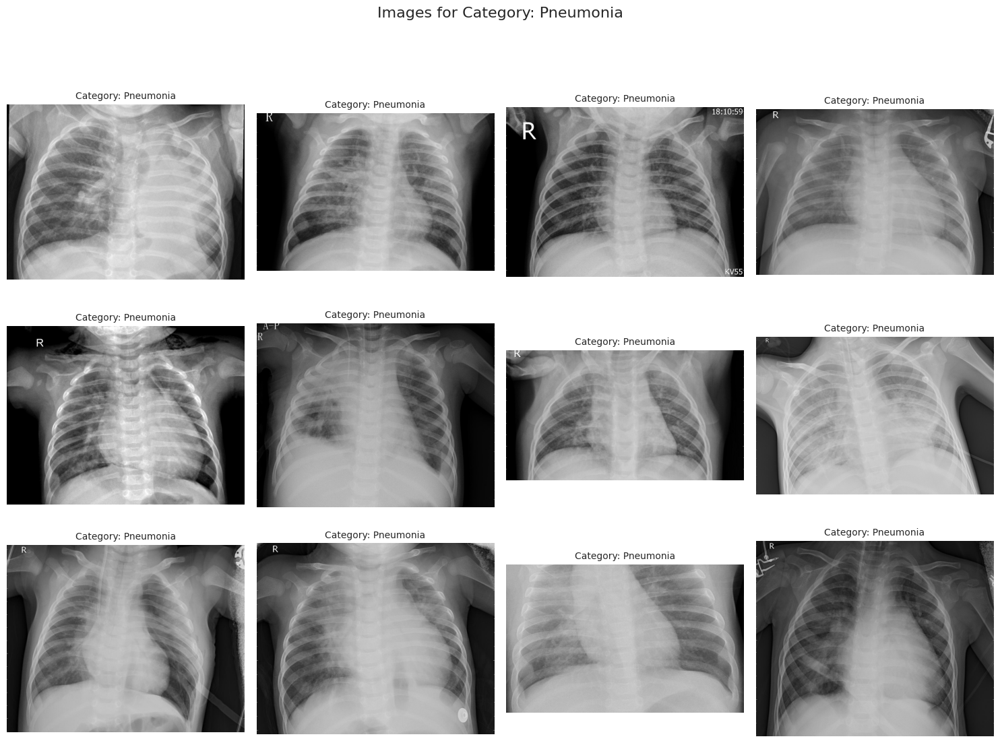

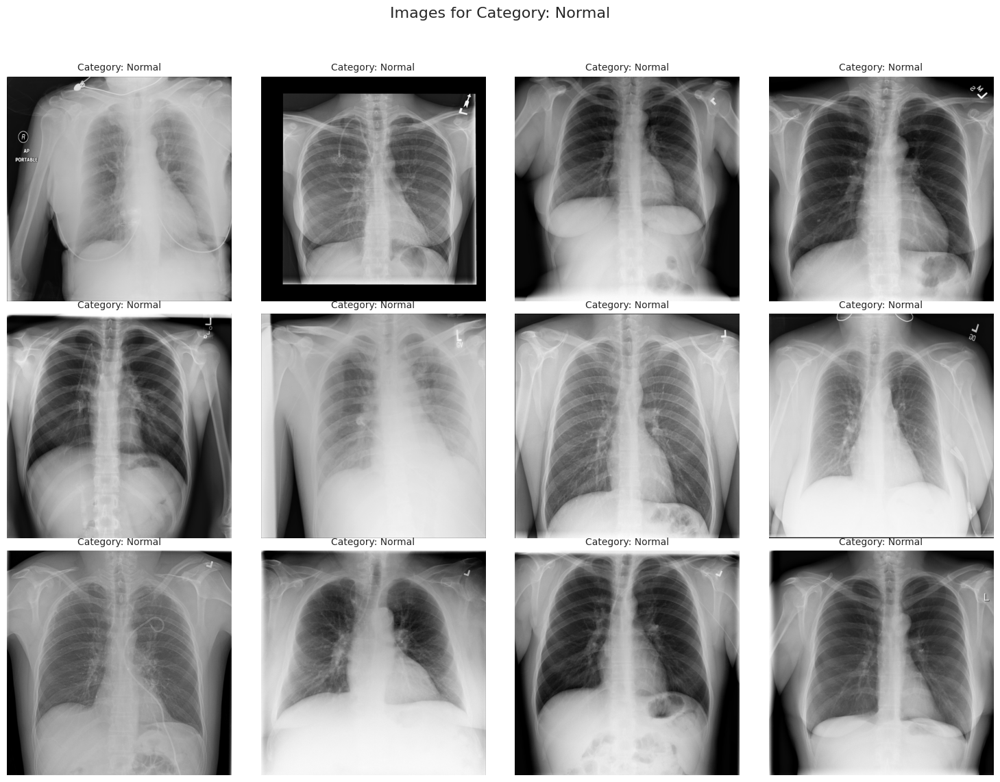

Dataset Summary:
Total images: 10056
Image dimensions: (224, 224)
Categories: [3 0 2 1]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2

# Mapping categories to their names
category_names = {0: 'Normal', 1: 'Normal', 2: 'Pneumonia', 3: 'Tuberculosis'}

def display_image_grid(df, title, num_images=12):
    plt.figure(figsize=(15, 12))
    plt.suptitle(title, fontsize=16)

    for i in range(min(num_images, len(df))):
        plt.subplot(3, 4, i + 1)
        img_path = df.iloc[i]['file_paths']
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f"Category: {category_names[df.iloc[i]['category']]}", fontsize=10)
        plt.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def summarize_dataset(df):
    print("Dataset Summary:")
    print("Total images:", len(df))
    print("Image dimensions:", df.iloc[0]['resized_images'].shape)
    print("Categories:", df['category'].unique())

for category in combine_data['category'].unique():
    display_image_grid(combine_data[combine_data['category'] == category], f"Images for Category: {category_names[category]}")

summarize_dataset(combine_data)


In [ ]:
# @title Splitting Training and Testing Data
# Import necessary libraries
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

X=combine_data["resized_images"]
Y=combine_data["category"]

# Convert labels to one-hot encoded format
# 'Y' is converted to a one-hot encoded format with 4 categories
Y = to_categorical(Y, 4)

# Split the dataset into training and testing sets
# X_train, X_test: partitions for the image data
# y_train, y_test: partitions for the corresponding one-hot encoded labels
# test_size=0.20: 20% of the data is used as the test set
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)

# Print the shapes of the training and testing sets
# X_train.shape: shows the dimensions of the training image dataset
# y_train.shape: shows the dimensions of the training label dataset
# X_test.shape: shows the dimensions of the testing image dataset
# y_test.shape: shows the dimensions of the testing label dataset
print("Training images shape:", X_train.shape)
print("Training labels shape:", y_train.shape)
print("Testing images shape:", X_test.shape)
print("Testing labels shape:", y_test.shape)

gc.collect()

Training images shape: (8044,)
Training labels shape: (8044, 4)
Testing images shape: (2012,)
Testing labels shape: (2012, 4)


2847

In [ ]:
# Direct conversion of Series to NumPy array
X_train_array = np.stack(X_train.to_numpy())

#tensor - keras, tensorflow
# Convert to float32 if not already
X_train_array = X_train_array.astype(np.float32)

# Normalising
X_train_array = X_train_array/255

# Convert to TensorFlow tensor
X_train = tf.convert_to_tensor(X_train_array)

# Check the shape
print("X_train Tensor Shape:", X_train.shape)

X_train Tensor Shape: (8044, 224, 224)


In [ ]:
X_test_array = np.stack(X_test.to_numpy())
X_test_array = X_test_array.astype(np.float32)
X_test_array = X_test_array/255
X_test = tf.convert_to_tensor(X_test_array)
print("X_test Tensor Shape:", X_test.shape)

X_test Tensor Shape: (2012, 224, 224)


In [ ]:
#deleting unwanted variable
del X_test_array
del X_train_array

In [ ]:
def print_dataset_shapes(X_train, y_train, X_test, y_test):
    print(f"Training data shape (images): {X_train.shape}")
    print(f"Training data shape (labels): {y_train.shape}")
    print(f"Testing data shape (images): {X_test.shape}")
    print(f"Testing data shape (labels): {y_test.shape}")

print_dataset_shapes(X_train, y_train, X_test, y_test)

Training data shape (images): (8044, 224, 224)
Training data shape (labels): (8044, 4)
Testing data shape (images): (2012, 224, 224)
Testing data shape (labels): (2012, 4)


In [ ]:
import tensorflow as tf
from tensorflow import keras

class CNN_Implemenation(keras.Model):
    def __init__(self):
        super(CNN_Implemenation, self).__init__()

        # Convolutional layers
        self.conv_layers = keras.Sequential([
            keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1)),
            keras.layers.MaxPooling2D((2, 2)),
            keras.layers.Conv2D(64, (3, 3), activation='relu'),
            keras.layers.MaxPooling2D((2, 2)),
            keras.layers.Conv2D(128, (3, 3), activation='relu'),
            keras.layers.Conv2D(128, (3, 3), activation='relu'),
            keras.layers.MaxPooling2D((2, 2))
        ])

        # Fully connected layers
        self.fc_layers = keras.Sequential([
            keras.layers.Flatten(),
            keras.layers.Dense(128, activation='relu'),
            keras.layers.Dense(4, activation='softmax')
        ])

    def call(self, inputs):
        x = self.conv_layers(inputs)
        return self.fc_layers(x)

model = CNN_Implemenation()

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.build((None, 224, 224, 1))
model.summary(expand_nested=True)


Model: "cnn__implemenation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 25, 25, 128)       240256    
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| conv2d (Conv2D)            (None, 222, 222, 32)      320      |
|                                                               |
| max_pooling2d (MaxPooling  (None, 111, 111, 32)      0        |
| 2D)                                                           |
|                                                               |
| conv2d_1 (Conv2D)          (None, 109, 109, 64)      18496    |
|                                                               |
| max_pooling2d_1 (MaxPooli  (None, 54, 54, 64)        0        |
| ng2D)                                                         |
|                                                               |
| conv2d_2 (Conv2D)          (None, 52, 52, 128)

In [ ]:
model.fit(X_train,y_train,epochs=10,validation_data=(X_test,y_test),batch_size=64)

Epoch 1/10
126/126 [==============================] - 1405s 11s/step - loss: 0.4527 - accuracy: 0.8277 - val_loss: 0.2064 - val_accuracy: 0.9220
Epoch 2/10
126/126 [==============================] - 1375s 11s/step - loss: 0.1950 - accuracy: 0.9320 - val_loss: 0.1819 - val_accuracy: 0.9369
Epoch 3/10
126/126 [==============================] - 1311s 10s/step - loss: 0.1321 - accuracy: 0.9543 - val_loss: 0.2026 - val_accuracy: 0.9319
Epoch 4/10
126/126 [==============================] - 1364s 11s/step - loss: 0.1018 - accuracy: 0.9662 - val_loss: 0.1872 - val_accuracy: 0.9359
Epoch 5/10
126/126 [==============================] - 1356s 11s/step - loss: 0.0777 - accuracy: 0.9718 - val_loss: 0.1494 - val_accuracy: 0.9493
Epoch 6/10
126/126 [==============================] - 1358s 11s/step - loss: 0.0631 - accuracy: 0.9782 - val_loss: 0.1687 - val_accuracy: 0.9478
Epoch 7/10
126/126 [==============================] - 1350s 11s/step - loss: 0.0542 - accuracy: 0.9827 - val_loss: 0.1546 - val_ac

In [ ]:
# @title Storing the Model History in json format
import json
with open('model_history.json', 'w') as f:
    json.dump(model.history.history, f)

In [ ]:
# @title Loading history
import json
with open('/content/drive/MyDrive/model_history.json', 'r') as f:
    history = json.load(f)

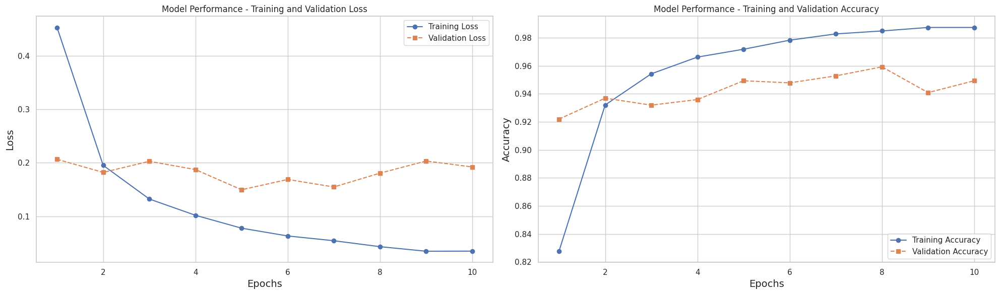

In [ ]:
# @title Model Accuracy and Loss Performance Over Each Epoch
import matplotlib.pyplot as plt
import seaborn as sns

def plot_single_model_history(history, title):
    sns.set(style="whitegrid")
    epochs = range(1, len(history['loss']) + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

    # Plotting Training and Validation Loss
    ax1.plot(epochs, history['loss'], 'o-', label='Training Loss')
    if 'val_loss' in history:
        ax1.plot(epochs, history['val_loss'], 's--', label='Validation Loss')

    # Plotting Training and Validation Accuracy
    ax2.plot(epochs, history['accuracy'], 'o-', label='Training Accuracy')
    if 'val_accuracy' in history:
        ax2.plot(epochs, history['val_accuracy'], 's--', label='Validation Accuracy')

    # Loss subplot settings
    ax1.set_title(f'{title} - Training and Validation Loss')
    ax1.set_xlabel('Epochs', fontsize=14)
    ax1.set_ylabel('Loss', fontsize=14)
    ax1.legend(loc='upper right')

    # Accuracy subplot settings
    ax2.set_title(f'{title} - Training and Validation Accuracy')
    ax2.set_xlabel('Epochs', fontsize=14)
    ax2.set_ylabel('Accuracy', fontsize=14)
    ax2.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

plot_single_model_history(history, 'Model Performance')

In [ ]:
# @title Usage of the saved model
model1 = CNN_Implemenation()
model1.build((None, 224, 224, 1))
model1.load_weights('/content/drive/MyDrive/CNN_model_weights.h5')

In [ ]:
# @title Prediction using the Model-CNN
y_pred = model1.predict(X_test)
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred, axis=1)


63/63 [==============================] - 95s 1s/step


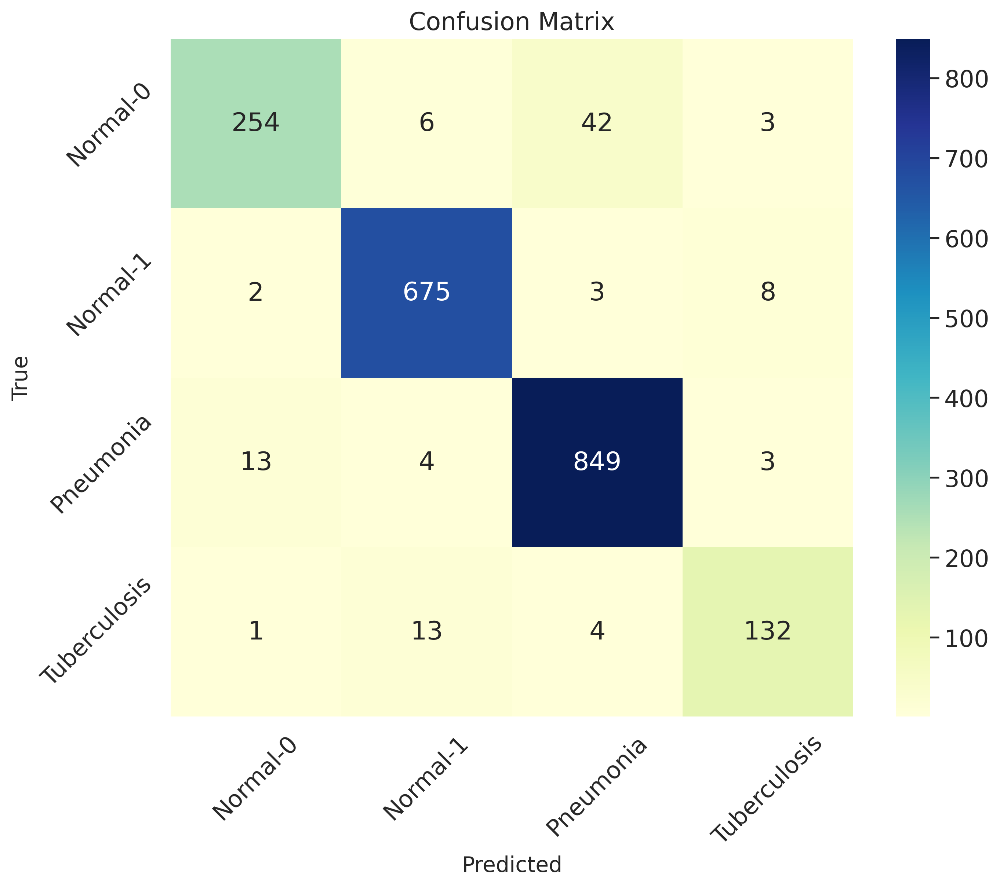

In [ ]:
# @title Confusion Matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

confusion = confusion_matrix(y_true, y_pred)

class_labels = ['Normal-0', 'Normal-1', 'Pneumonia', 'Tuberculosis']

plt.figure(figsize=(10, 8), dpi=300)
sns.set(font_scale=1.4)
sns.heatmap(confusion, annot=True, fmt="d", cmap="YlGnBu", xticklabels=class_labels, yticklabels=class_labels)

plt.xticks(rotation=45)
plt.yticks(rotation=45)

plt.xlabel('Predicted', fontsize=14)
plt.ylabel('True', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)

plt.show()


In [ ]:
y_pred

array([1, 2, 3, ..., 2, 1, 1])

In [ ]:
# @title Classification report metric per class
import pandas as pd
import plotly.express as px
from sklearn.metrics import classification_report

report = classification_report(y_true, y_pred, output_dict=True)

report_df = pd.DataFrame(report).transpose().reset_index()
report_df.rename(columns={'index': 'Class'}, inplace=True)
report_df = report_df.drop(columns=['support'], errors='ignore')

# Melt the DataFrame for Plotly
melted_df = report_df.melt(id_vars="Class", var_name="Metric", value_name="Value")

fig = px.bar(melted_df, x='Value', y='Class', color='Metric', barmode='group',
             labels={'Value': 'Metric Value', 'Class': 'Class'},
             title='Classification Report Metrics per Class')

fig.update_layout(
    xaxis_title='Metric Value',
    yaxis_title='Class',
    legend_title='Metric',
    plot_bgcolor='white',
    font=dict(size=12, color='black')
)

fig.update_traces(hoverinfo='all', hovertemplate="Class: %{y}<br>Metric: %{x}<br>Value: %{text}",
                  text=melted_df['Value'])

fig.show()


In [ ]:
print("Classification Report:")
print(classification_report(y_true,y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.91      0.95       305
           1       0.99      0.99      0.99       688
           2       0.97      0.99      0.98       869
           3       0.97      0.95      0.96       150

    accuracy                           0.98      2012
   macro avg       0.98      0.96      0.97      2012
weighted avg       0.98      0.98      0.98      2012



In [ ]:
# @title Saving Model
model.save_weights('CNN_model_weights.h5')

In [ ]:
# @title Usage of the saved model
model1 = CNN_Implemenation()
model1.build((None, 224, 224, 1))
model1.load_weights('/content/drive/MyDrive/CNN_model_weights.h5')

In [ ]:
# @title Prediction using the Model1
y_pred = model1.predict(X_test)
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(y_pred, axis=1)

63/63 [==============================] - 94s 1s/step


In [ ]:
# @title Preprocessing the uploaded Image
import cv2
import tensorflow as tf
import numpy as np

def preprocess_image(image_path):
    # Read and resize the image to 224x224 pixels
    img = cv2.imread(image_path, 0)
    img_resized = cv2.resize(img, (224, 224))

    img_normalized = img_resized / 255.0

    img_tensor = np.expand_dims(img_normalized, axis=0)
    img_tensor = np.expand_dims(img_tensor, axis=-1)

    img_tensor = tf.convert_to_tensor(img_tensor, dtype=tf.float32)

    return img_tensor

In [ ]:
# @title Function to Revert Test images from Tensor to Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

def tensor_to_image(tensor, index):
    image = tensor[index]

    image = image * 255.0

    if len(image.shape) == 4:
        image = np.squeeze(image, axis=0)
    image = np.clip(image, 0, 255).astype('uint8')

    return image


1/1 [==============================] - 0s 315ms/step


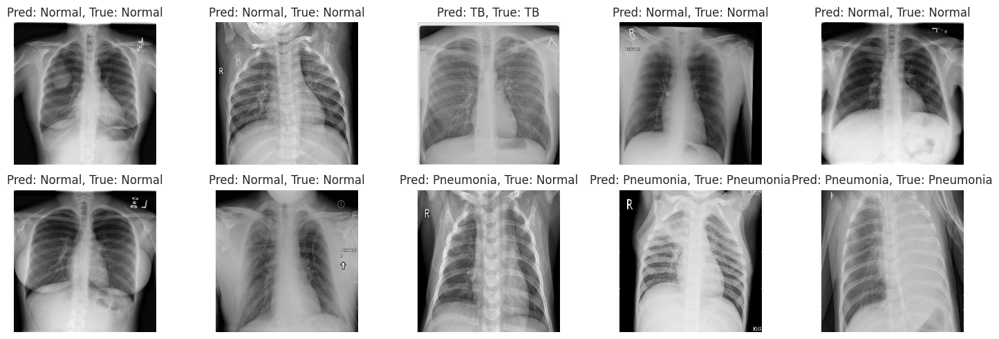

In [ ]:
# @title Prediction of X_test samples data
import matplotlib.pyplot as plt

def display_sample_predictions(model, X_data, y_data, num_samples=10):
    indices = np.random.choice(range(len(X_data)), num_samples)

    X_samples, y_samples = tf.gather(X_data, indices), y_data[indices]

    y_pred = model.predict(X_samples)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_samples, axis=1)
    category_names = {0: 'Normal', 1: 'Normal', 2: 'Pneumonia', 3: 'TB'}
    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        plt.subplot(2, 5, i + 1)
        plt.imshow(tensor_to_image(X_samples, i), cmap='gray')
        plt.title(f"Pred: {category_names[y_pred_classes[i]]}, True: {category_names[y_true_classes[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

display_sample_predictions(model1, X_test, y_test)